In [1]:
import sys
from pathlib import Path
SCRIPTS = Path().resolve() / "libraries"
if str(SCRIPTS) not in sys.path:
    sys.path.insert(0, str(SCRIPTS))
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy as sp
import scipy.stats as stats
from astropy.io import fits
from astropy import table
import matplotlib
import matplotlib.patheffects as path_effects
import importlib
import stream_functions as stream_funcs
importlib.reload(stream_funcs)
import emcee
import corner
from astropy.table import Table
from astropy import units as u
from collections import OrderedDict
import time
from scipy import optimize, stats
import matplotlib.colors as mcolors
colors = mcolors.CSS4_COLORS
color_names = list(colors.keys())
import streamTutorial as st
import copy
importlib.reload(st);

import importlib
import post_mcmc
import numpy as np
importlib.reload(post_mcmc)
from gala.coordinates import GreatCircleICRSFrame
import astropy.coordinates as coord
from astropy import units as u
import matplotlib.pyplot as plt
from post_mcmc import plot_form
import copy
import pandas as pd
import stream_functions as stream_funcs
import streamTutorial as st
from astropy import table

ModuleNotFoundError: No module named 'scripts'

In [2]:
# Pole coordinates from https://iopscience.iop.org/article/10.3847/1538-4357/ad382d/pdf

pole_df = pd.read_csv('./data/Table_3_Gaia_DR3_Complete_Untruncated.txt', skiprows = [0,1],
             engine='python', on_bad_lines='skip', sep='\s+', usecols = [1,3,4,5,6,7,8,9])


pole_df.columns = ['Name', 'ra0', 'ra', 'dec', 'n', 'nv', 'M*', '<[Fe/H]>']

pole_df["dec"] = pole_df["dec"].str.replace('−', '-').astype(float)
pole_df["<[Fe/H]>"] = pole_df["<[Fe/H]>"].str.replace('−', '-').astype(float)

In [3]:
pole_df

,Name,ra0,ra,dec,n,nv,M*,<[Fe/H]>
0,C-20,0.561,275.038,-30.900,29,8,1200,-2.93
1,SGP-S,6.705,273.230,-5.703,36,1,530,-2.22
2,NGC288,13.188,101.350,1.686,173,7,2200,-1.32
3,ATLAS,20.185,75.623,47.653,208,80,19000,-2.20
4,Phoenix,24.341,309.372,12.542,58,26,3000,-2.70
...,...,...,...,...,...,...,...,...
82,New-27,342.224,80.278,-5.920,37,8,410,-2.08
83,NGC7492,347.111,89.005,-34.892,26,1,3300,-1.78
84,C-19,354.356,81.450,-6.346,46,12,3200,-3.58
85,Jhelum,355.231,5.299,37.216,986,160,17000,-2.12


In [6]:
import gala.coordinates as gc
import astropy.coordinates as acoord
import astropy.units as auni
ra0, dec0 = 259.280792, 43.135944

# define endpoints and origin
endpoints = acoord.SkyCoord(
    ra=[256, 262]*auni.deg,
    dec=[41.6, 42.4]*auni.deg
    )
origin = acoord.SkyCoord(ra0, dec0, unit=auni.deg)
M92_frame = gc.GreatCircleICRSFrame.from_endpoints(  
    endpoints[0], endpoints[1], origin=origin)

/opt/anaconda3/envs/streamTutorial/lib/python3.11/site-packages/gala/coordinates/greatcircle.py:197: RuntimeWarning: Input origin and pole are not orthogonal. Keeping the origin fixed and adjusting the pole to be orthogonal. Use warnings.simplefilter('ignore') to ignore this warning.
  warn(



In [11]:
SN = 'M92'
stream = pole_df[pole_df['Name'] == SN]
#--------------
fr = M92_frame
#--------------

import galstreams
mwsts = galstreams.MWStreams(verbose=False, implement_Off=True)
SoI_galstream = mwsts.get(SN + '-I21', None)

Initializing galstreams library from master_log... 


In [74]:
min_dist = 8.3#np.min(SoI_galstream.track.distance.value)

# fr = GreatCircleICRSFrame.from_pole_ra0(pole=coord.SkyCoord(ra=81.45*u.deg, dec=-6.346*u.deg), ra0=354.356*u.deg)

# def get_mem_path from directory, grabbing .fits file that includese 0.5%_mem in the name
def get_mem_path(directory):
    import os
    files = os.listdir(directory)
    for file in files:
        if ('0.5%_mem' in file or '50%_mem' in file) and file.endswith('.fits'):
            return os.path.join(directory, file)

mem_path = get_mem_path('/Users/nasserm/Documents/vscode/research/streamTut/DESI_loa_c19/runs/M92-I21_260119_generic_test_locTrue/')
stream_data, stream_run_directory = post_mcmc.load_stream_mems(mem_path)

In [75]:
stream_run_directory

'/Users/nasserm/Documents/vscode/research/streamTut/DESI_loa_c19/runs/M92-I21_260119_generic_test_locTrue'

In [76]:
print('Loading desi_data...')
desi_data = post_mcmc.load_desi_data(desi_path = '/Users/nasserm/Documents/vscode/research/streamTut/DESI_loa_c19/data/cleaned_loa_15_09_2025.fits', fr=fr, local=True, distance_path = '/Users/nasserm/Documents/vscode/research/streamTut/DESI_loa_c19/data/rvsdistnn-loa-241126.fits')
print('Desi data loaded')

desi_data['VGSR'] = stream_funcs.vhel_to_vgsr(
    np.array(desi_data['TARGET_RA']) * u.deg,
    np.array(desi_data['TARGET_DEC']) * u.deg,
    np.array(desi_data['VRAD']) * (u.km / u.s),
).value

# #                self.desi_data['phi1'], self.desi_data['phi2'] = stream_funcs.ra_dec_to_phi1_phi2(
#                     self.frame,
#                     np.array(self.desi_data['TARGET_RA']) * u.deg,
#                     np.array(self.desi_data['TARGET_DEC']) * u.deg,
#                 )
desi_data['phi1'], desi_data['phi2'] = stream_funcs.ra_dec_to_phi1_phi2(
    fr,
    np.array(desi_data['TARGET_RA']) * u.deg,
    np.array(desi_data['TARGET_DEC']) * u.deg,
)

Loading desi_data...
RVS distances added
Desi data loaded


# Create stream class

In [227]:
importlib.reload(post_mcmc)
c19 = post_mcmc.StreamMembers(min_dist=min_dist, stream_data=stream_data, desi_data = desi_data, stream_run_directory=stream_run_directory, fr=fr, withBHB=True, withRRL=True)

Loading desi_data...
Desi data loaded
getting BHB and RRL data...


Done


# Posterior Pred. Check

In [17]:
import matplotlib

In [18]:
def gaus2d(X, mu_x, Y, mu_y, sigma_x,sigma_y):
    return np.exp(-(((X - mu_x)**2)/ (2*sigma_x**2)+ ((Y-mu_y)**2 / (2*sigma_y**2))))


In [19]:
for i, name in enumerate(c19.nested_dict['param_labels']):
    print(i, name)

0 pstream
1 vgsr_spline_points
2 lsigvgsr
3 feh1
4 lsigfeh
5 pmra_spline_points
6 lsigpmra
7 pmdec_spline_points
8 lsigpmdec
9 bv
10 lsigbv
11 bfeh
12 lsigbfeh
13 bpmra
14 lsigbpmra
15 bpmdec
16 lsigbpmdec


In [20]:
for i, name in enumerate(c19.nested_dict['expanded_param_labels']):
    print(i, name)

0 pstream
1 vgsr1
2 vgsr2
3 vgsr3
4 lsigvgsr
5 feh1
6 lsigfeh
7 pmra1
8 pmra2
9 pmra3
10 lsigpmra
11 pmdec1
12 pmdec2
13 pmdec3
14 lsigpmdec
15 bv
16 lsigbv
17 bfeh
18 lsigbfeh
19 bpmra
20 lsigbpmra
21 bpmdec
22 lsigbpmdec


In [21]:
import corner
def flatter(obj):
    for x in obj:
        if isinstance(x, (list, tuple)):
            yield from flatter(x)
        else:
            yield x

In [22]:
extended_meds = list(flatter(c19.nested_dict['meds']))
phi1_spline_points = c19.spline_points_dict['phi1_spline_points']

In [23]:
# pick = np.array([1, 2, 3, 4, 5, 6, 7])
# pick = np.array([9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 7])
pick = np.array([0,3, 11, 16, 6, 7, 8])
# pick = np.array([14, 20])
# pick = np.arange(len(extended_meds))

labels = [c19.mcmc_dict['extended_param_labels'][p] for p in pick]
chain = np.vstack([c19.mcmc_dict['flatchain'][:, p] for p in pick])
mu = {l: extended_meds[c19.mcmc_dict['extended_param_labels'].index(l)] for l in labels}
std = {l: c19.mcmc_dict['flatchain'][:, c19.mcmc_dict['extended_param_labels'].index(l)].std() for l in labels}


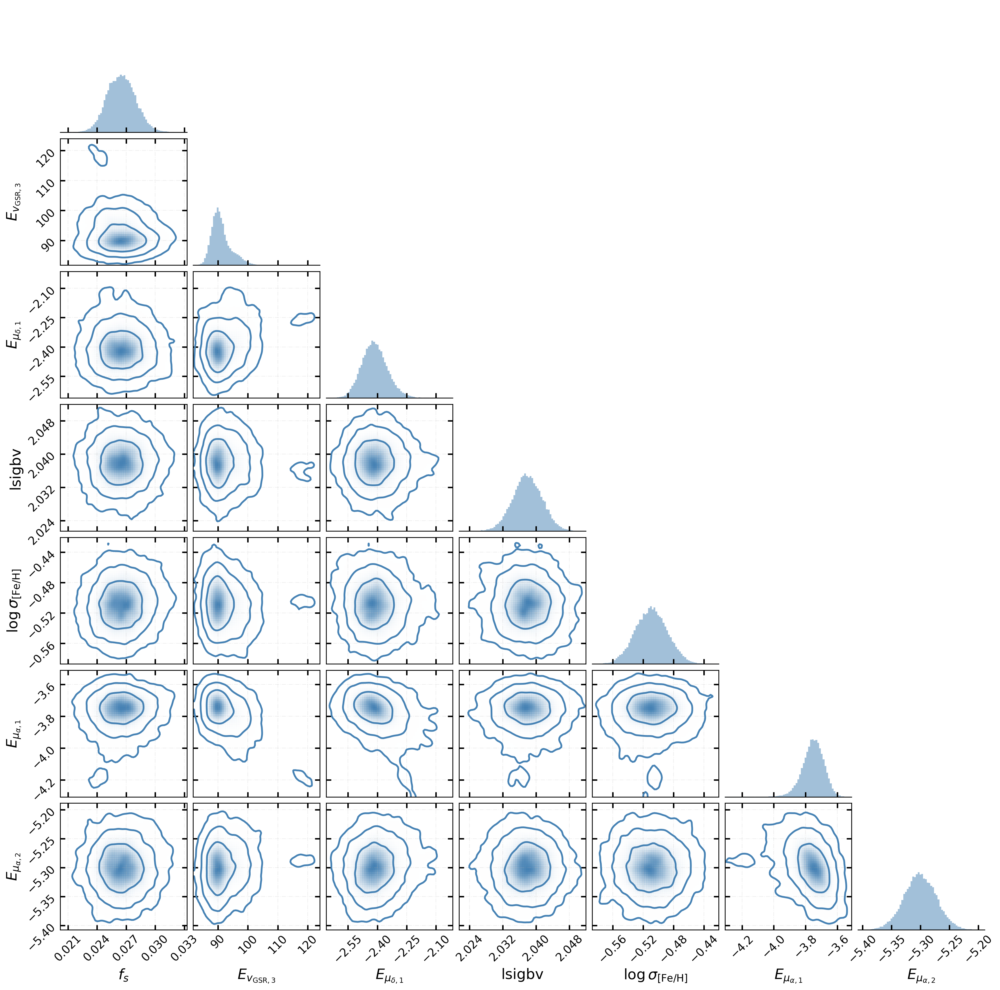

In [25]:
import streamTutorial as st
st.set_presentation(True)

def pretty_label(lbl):
    if lbl.startswith("vgsr"):
        return rf"$E_{{v_{{\text{{GSR}}, {lbl[4:]}}}}}$"
    if lbl.startswith("pmra"):
        return rf"$E_{{\mu_{{\alpha, {lbl[4:]}}}}}$"
    if lbl.startswith("pmdec"):
        return rf"$E_{{\mu_{{\delta, {lbl[5:]}}}}}$"
    if lbl.startswith("lsigvgsr"):
        return rf"$\log \sigma_{{v_{{\text{{GSR}} {lbl[8:]}}}}}$"
    if lbl.startswith("lsigfeh"):
        return rf"$\log \sigma_{{[\text{{Fe/H}}] {lbl[7:]}}}$"
    if lbl == "feh1":
        return r"$E_{[\text{Fe/H}]}$"
    if lbl == "pstream":
        return r"$f_s$"
    return lbl

corner_labels = [pretty_label(lbl) for lbl in labels]
fig = corner.corner(chain.T, color='steelblue', labels=corner_labels, smooth=1.5, bins=70, levels=[0.68, 0.95, .997], plot_datapoints=False,
                    hist_kwargs={"density": True, "color": "steelblue", "histtype": "stepfilled", "alpha": 0.5},
                    )
fig.set_size_inches(2.5 * chain.T.shape[1], 2.5 * chain.T.shape[1])

for ax in fig.axes:
    plot_form(ax)
    ylim = ax.get_ylim()
    xlim = ax.get_xlim()
    ax.set_ylim(ylim[0] * 1, ylim[1] * 1)
    ax.set_xlim(xlim[0] * 1, xlim[1] * 1)
    ax.tick_params(which="minor", color='1', length=0)

for ax in np.diag(np.array(fig.axes).reshape(chain.T.shape[1], chain.T.shape[1])):
    ylim = ax.get_ylim()
    ax.set_ylim(ylim[0], ylim[1] * 2)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.tick_params(which="both", direction="in", top=False)
    ax.grid(alpha=0)
    # ax.spines["bottom"].set_visible(False)

# fig.axes[0, 1].scatter(c19.stream)
# rasterize
# for ax in fig.axes:
#     ax.set_rasterized(True)

# fig.savefig('./figs/corner.pdf', dpi=300)


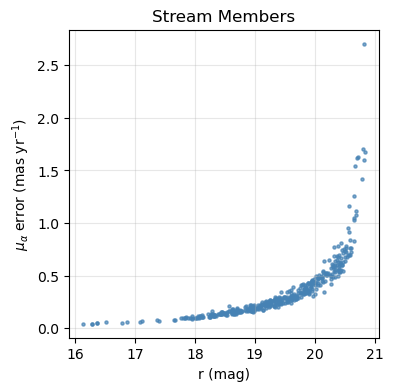

In [26]:
# plotting pmra error vs r magnitude
# convert R_FLUX to r magnitude
st.set_presentation(False)
c19.stream_data['r'] = 22.5 - 2.5 * np.log10(c19.stream_data['FLUX_R'])
plt.figure(figsize=(4,4))
plt.scatter(c19.stream_data['r'],c19.stream_data['PMRA_ERROR'], s=5, color='steelblue', alpha=0.7)
# plt.gca().invert_xaxis()
plt.ylabel(r'${\mu_\alpha}$ error (mas yr$^{-1}$)')
plt.xlabel('r (mag)')
plt.title('Stream Members')
plt.grid(alpha=0.3)

In [27]:
len(c19.stream_data['phi1'])/len(c19.all_memberships)

0.02728013029315961

In [28]:
for i, name in enumerate(c19.nested_dict['expanded_param_labels']):
    print(i, name)

0 pstream
1 vgsr1
2 vgsr2
3 vgsr3
4 lsigvgsr
5 feh1
6 lsigfeh
7 pmra1
8 pmra2
9 pmra3
10 lsigpmra
11 pmdec1
12 pmdec2
13 pmdec3
14 lsigpmdec
15 bv
16 lsigbv
17 bfeh
18 lsigbfeh
19 bpmra
20 lsigbpmra
21 bpmdec
22 lsigbpmdec


In [29]:
background_stars = c19.all_memberships[c19.all_memberships['stream_prob'] <= 0.5]
vgsr_func = lambda phi1_arr, meds: stream_funcs.apply_spline(phi1_arr, phi1_spline_points, meds)

In [424]:
def draw_stream(stream_idx, stream_df, n_samples):
    pick = stream_idx
    stream_phi1_arr = stream_df['phi1']
    labels = [c19.mcmc_dict['extended_param_labels'][p] for p in pick]

    rng = np.random.default_rng()
    flatchain = c19.mcmc_dict['flatchain']
    extended_labels = c19.mcmc_dict['extended_param_labels']
    label_idx = {label: extended_labels.index(label) for label in labels}
    chain_idx = rng.integers(0, flatchain.shape[0])
    theta_row = flatchain[chain_idx]

    star = []
    for _ in stream_phi1_arr:
        draw = {label: theta_row[label_idx[label]] for label in labels}
        star.append(draw)

    star_draw = []
    final_labels = ['VGSR', 'FEH', 'PMRA', 'PMDEC', 'phi1']

    for s, phi1 in zip(star, stream_phi1_arr):
        star_properties = {}
        for labl in final_labels:
            if labl == 'VGSR':
                vgsr = vgsr_func(phi1, np.array([s['vgsr1'], s['vgsr2'], s['vgsr3'], s['vgsr4'], s['vgsr5']]))
                star_properties[labl] = rng.normal(vgsr, 10**s['lsigvgsr'])
            elif labl == 'PMRA':
                pmra = stream_funcs.apply_spline(phi1, c19.spline_points_dict['phi1_spline_points'],
                                                 np.array([s['pmra1'], s['pmra2'], s['pmra3'], s['pmra4'], s['pmra5']]))
                star_properties[labl] = rng.normal(pmra, 0.09)
            elif labl == 'PMDEC':
                pmdec = stream_funcs.apply_spline(phi1, c19.spline_points_dict['phi1_spline_points'],
                                                  np.array([s['pmdec1'], s['pmdec2'], s['pmdec3'], s['pmdec4'], s['pmdec5']]))
                star_properties[labl] = rng.normal(pmdec, 0.09)
            elif labl == 'FEH':
                star_properties[labl] = rng.normal(s['feh1'], 10**s['lsigfeh'])
            else:
                star_properties['phi1'] = phi1
        star_draw.append(star_properties)

    star_draw_df = pd.DataFrame(star_draw)

    err_labels = ['VRAD_ERR', 'FEH_ERR', 'PMRA_ERROR', 'PMDEC_ERROR']
    err_df = stream_df[err_labels]

    error_draw = {}
    for labl, err_labl in zip(final_labels, err_labels):
        mu = np.asarray(star_draw_df[labl], dtype=float)
        sigma = np.asarray(err_df[err_labl], dtype=float)
        error_draw[labl] = rng.normal(loc=mu, scale=sigma, size=(n_samples, mu.size))

    rows = []
    for i, phi1_val in enumerate(star_draw_df['phi1']):
        df = pd.DataFrame({lab: error_draw[lab][:, i] for lab in error_draw})
        df['phi1'] = phi1_val
        rows.append(df)

    error_draw_df = pd.concat(rows, ignore_index=True)

    return star_draw_df, error_draw_df

def sample_err(mu, err, N):
    return np.random.default_rng.normal(loc=mu, scale=err, size=(N, )+mu.shape)

def draw_background(background_idx, background_df, n_samples, reject_df=None):
    pick = background_idx
    phi1_vals = np.asarray(background_df['phi1'], dtype=float)

    # Use whichever catalogue defines the selection window
    window_df = background_df if reject_df is None else reject_df
    bounds = {
        'VGSR': (np.nanmin(window_df['VGSR']), np.nanmax(window_df['VGSR'])),
        'PMRA': (np.nanmin(window_df['PMRA']), np.nanmax(window_df['PMRA'])),
        'PMDEC': (np.nanmin(window_df['PMDEC']), np.nanmax(window_df['PMDEC'])),
        'FEH':  (np.nanmin(window_df['FEH']),  np.nanmax(window_df['FEH'])),
    }

    labels = [c19.mcmc_dict['extended_param_labels'][p] for p in pick]
    rng = np.random.default_rng()
    flatchain = c19.mcmc_dict['flatchain']
    extended_labels = c19.mcmc_dict['extended_param_labels']
    label_idx = {label: extended_labels.index(label) for label in labels}
    theta_row = flatchain[rng.integers(0, flatchain.shape[0])]
    theta_map = {label: theta_row[label_idx[label]] for label in labels}

    star_draw = []
    for phi1 in phi1_vals:
        for _ in range(10_000):  # intrinsic rejection
            candidate = {
                'VGSR': rng.normal(theta_map['bv'],     10 ** theta_map['lsigbv']),
                'PMRA': rng.normal(theta_map['bpmra'],  10 ** theta_map['lsigbpmra']),
                'PMDEC': rng.normal(theta_map['bpmdec'], 10 ** theta_map['lsigbpmdec']),
                'FEH':  rng.normal(theta_map['bfeh'],   10 ** theta_map['lsigbfeh']),
                'phi1': phi1,
            }
            if all(bounds[key][0] <= candidate[key] <= bounds[key][1] for key in bounds):
                star_draw.append(candidate)
                break
        else:
            raise RuntimeError("Unable to draw intrinsic background star inside bounds after 10,000 attempts")

    star_draw_df = pd.DataFrame(star_draw)

    err_labels = {
        'VGSR': 'VRAD_ERR',
        'PMRA': 'PMRA_ERROR',
        'PMDEC': 'PMDEC_ERROR',
        'FEH':  'FEH_ERR',
    }
    err_df = background_df[list(err_labels.values())]
    n_stars = len(star_draw_df)
    error_draw = {key: np.empty((n_samples, n_stars), dtype=float) for key in err_labels}
    phi1_draw = np.repeat(phi1_vals[np.newaxis, :], n_samples, axis=0)

    for i in range(n_stars):
        for key, err_name in err_labels.items():
            mu = float(star_draw_df.iloc[i][key])
            sigma = float(err_df.iloc[i][err_name])
            low, high = bounds[key]
            for k in range(n_samples):
                for _ in range(10_000):  # measurement rejection
                    sample = rng.normal(mu, sigma)
                    if low <= sample <= high:
                        error_draw[key][k, i] = sample
                        break
                else:
                    raise RuntimeError(f"Unable to draw noisy {key} inside bounds after 10,000 attempts")

    rows = []
    for k in range(n_samples):
        df = pd.DataFrame({key: error_draw[key][k] for key in err_labels})
        df['phi1'] = phi1_draw[k]
        rows.append(df)

    error_draw_df = pd.concat(rows, ignore_index=True)
    return star_draw_df, error_draw_df


In [425]:
# Posterior draws → predictive catalogues
rng = np.random.default_rng(2025)
chain = c19.mcmc_dict['flatchain']
labels = c19.mcmc_dict['extended_param_labels']
phi1_nodes = np.asarray(c19.stream_data['phi1'], dtype=float)
phi1_knots = c19.spline_points_dict['phi1_spline_points']

err_cols = {
    'VGSR': 'VRAD_ERR',
    'PMRA': 'PMRA_ERROR',
    'PMDEC': 'PMDEC_ERROR',
    'FEH': 'FEH_ERR',
}
stream_errors = {col: np.asarray(c19.stream_data[col], dtype=float) for col in err_cols.values()}
coeff_count = 5  # spline control points per observable

/var/folders/cp/8z3h6wl95fn4l6kxwr2y_0hm0000gn/T/ipykernel_70337/2692912601.py:95: UserWarning: Rasterization of '<matplotlib.contour.QuadContourSet object at 0x335782410>' will be ignored
  artist.set_rasterized(True)

/var/folders/cp/8z3h6wl95fn4l6kxwr2y_0hm0000gn/T/ipykernel_70337/2692912601.py:95: UserWarning: Rasterization of '<matplotlib.contour.QuadContourSet object at 0x3358f1750>' will be ignored
  artist.set_rasterized(True)

/var/folders/cp/8z3h6wl95fn4l6kxwr2y_0hm0000gn/T/ipykernel_70337/2692912601.py:95: UserWarning: Rasterization of '<matplotlib.contour.QuadContourSet object at 0x3359fe3d0>' will be ignored
  artist.set_rasterized(True)

/var/folders/cp/8z3h6wl95fn4l6kxwr2y_0hm0000gn/T/ipykernel_70337/2692912601.py:95: UserWarning: Rasterization of '<matplotlib.contour.QuadContourSet object at 0x341b2be50>' will be ignored
  artist.set_rasterized(True)

/var/folders/cp/8z3h6wl95fn4l6kxwr2y_0hm0000gn/T/ipykernel_70337/2692912601.py:95: UserWarning: Rasterization of '<matpl

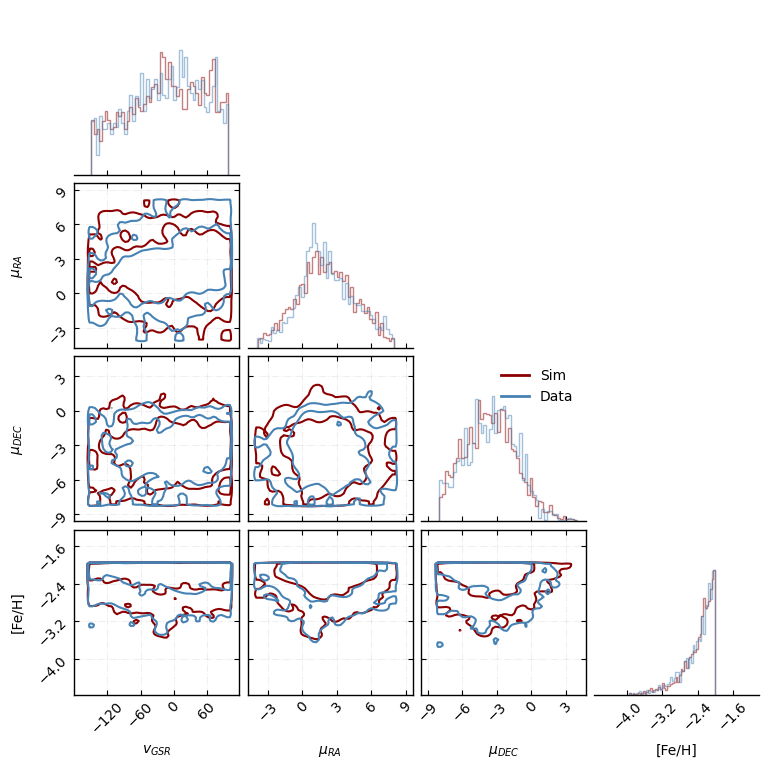

In [426]:
summary_keys = ['VGSR', 'PMRA', 'PMDEC', 'FEH']
summary_labels = [r'$v_{GSR}$', r'$\mu_{RA}$', r'$\mu_{DEC}$', r'[Fe/H]']#[f'{key}' for key in summary_keys]

def catalogue_means(df):
    return np.array([np.nanmean(df[key]) for key in summary_keys])

# samples = []
# for _ in range(n_draw):                       # or use len(posterior_idx)
#     _, cat_with_errors = draw_stream(np.arange(1, 19), c19.stream_data, n_samples=1)
#     samples.append(cat_with_errors)

# samples = np.array(summary_samples, dtype=float) 

samples_draw, samples_werr = draw_stream(np.arange(1, 19), c19.stream_data, n_samples=1)
observed = c19.stream_data.to_pandas()

background_draw, background_error_draw = draw_background(
    np.arange(19, 27), background_stars, 1, c19.all_memberships
)

sample_v = pd.concat([samples_draw, background_draw])


st.set_presentation(False)
fig = corner.corner(
    sample_v[summary_keys],
    labels=summary_labels,
    color='darkred',
    smooth=1.5,
    bins=50,
    levels=[0.68, 0.95],
    plot_density=False,
    plot_datapoints=False,
    hist_kwargs={"density": False, "color": "darkred", "histtype": "step", "alpha": 0.5},
)

corner.corner(
    c19.all_memberships[summary_keys],
    labels=summary_labels,
    color='steelblue',
    smooth=1.5,
    bins=50,
    levels=[0.68, 0.95],
    plot_density=False,
    plot_datapoints=False,
    hist_kwargs={"density": False, "color": "steelblue", "histtype": "step", "alpha": 0.5},
    fig=fig
)

fig.set_size_inches(2 * len(summary_labels), 2 * len(summary_labels))


axes_grid = np.array(fig.axes).reshape(len(summary_labels), len(summary_labels))
# for i, lbl_i in enumerate(summary_labels):
#     for j, lbl_j in enumerate(summary_labels):
#         ax = axes_grid[i, j]
#         if i < j:
#             ax.set_visible(False)
#             continue
#         if i != j:
#             ax.scatter(samples[lbl])

for ax in fig.axes:
    plot_form(ax)
    ylim = ax.get_ylim()
    xlim = ax.get_xlim()
    axis_scale_y = 1.2
    axies_scale_x = 1.2
    ax.set_ylim(ylim[0]*axis_scale_y, ylim[1]*axis_scale_y if ylim[1]>0 else ylim[1]+0.75)
    ax.set_xlim(xlim[0]*axies_scale_x, xlim[1]*axies_scale_x if xlim[1]>0 else xlim[1]+1)
    ax.tick_params(which="minor", color='1', length=0)

for i, ax in enumerate(np.diag(axes_grid)):
    # ax.hist(background_error_draw[summary_keys[i]], bins=30, density=False, histtype='stepfilled', facecolor='royalblue', ls='solid', lw=1.5, edgecolor='black')
    # ax.hist(samples_werr[summary_keys[i]], bins=7, density=False, histtype='stepfilled', facecolor='lightcoral', ls='solid', lw=1.5, edgecolor='black')
    # ax.hist(c19.stream_data[summary_keys[i]], bins=30, density=False, histtype='stepfilled', facecolor='steelblue', ls='solid', lw=1.5, edgecolor='black')
    
    ylim = ax.get_ylim()
    ax.set_ylim(ylim[0], ylim[1]*1)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.tick_params(which="both", direction="in", top=False)
    ax.grid(alpha=0)

# axes_grid[0,1].scatter([],[], marker='s', facecolor='skyblue', edgecolor='k', label='Sim Stream')
# axes_grid[0,1].scatter([],[], marker='s', facecolor='0.2', edgecolor='k', label='True Stream')
# axes_grid[0,1].legend()
axes_grid[2,2].plot([], [], lw=2, c='darkred', label='Sim')
axes_grid[2,2].plot([], [], lw=2, c='steelblue', label='Data')
axes_grid[2,2].legend(frameon=False)

for ax in fig.axes:
    for artist in ax.collections:  # scatter, contourf, etc.
        artist.set_rasterized(True)

fig.savefig('./figs/ppc_all.pdf', dpi=300)



In [427]:
np.mean(c19.stream_data['PMRA_ERROR']), np.mean(c19.stream_data['PMDEC_ERROR'])

(0.24272933320799372, 0.194735095070314)

In [428]:
import pandas as pd

# Drop duplicate TARGETID entries from c19.all_memberships (keep first occurrence)

df = c19.all_memberships
# Convert astropy Table -> pandas DataFrame if needed
if not isinstance(df, pd.DataFrame):
    if hasattr(df, "to_pandas"):
        df = df.to_pandas()
    else:
        df = pd.DataFrame(df)

if 'TARGETID' in df.columns:
    before = len(df)
    df = df.drop_duplicates(subset='TARGETID', keep='first').reset_index(drop=True)
    c19.all_memberships = df
    after = len(df)
    print(f"Dropped {before-after} duplicate rows. Remaining rows: {after}")
else:
    print("Column 'TARGETID' not found in c19.all_memberships. Available columns:", list(df.columns))

Dropped 214 duplicate rows. Remaining rows: 1875


In [429]:
# --- Bayesian posterior predictive draws (500 posterior samples) ---
n_draws = 500

# lists to collect predictive datasets from many posterior draws
ppc_list = []

for _ in range(n_draws):

    # 1 posterior sample per loop:
    _, samples_werr = draw_stream(np.arange(1, 19), c19.stream_data, n_samples=1)
    _, background_werr = draw_background(np.arange(19, 27), background_stars, 1, c19.all_memberships)

    # full mock dataset for this posterior draw
    mock = pd.concat([samples_werr, background_werr], ignore_index=True)
    ppc_list.append(mock)

# --- Combine all PPC draws into one big predictive dataframe ---
ppc_all = pd.concat(ppc_list, ignore_index=True)

# --- Group by phi1 just like before ---
grouped = ppc_all.groupby("phi1")[summary_keys]

# --- Bayesian predictive interval (16–84%) ---
_ci = pd.concat(
    {
        'mean': grouped.mean(),
        'ci_lower': grouped.quantile(0.16),
        'ci_upper': grouped.quantile(0.84),
    },
    axis=1,
)

# --- Bayesian predictive interval (2.5–97.5%) ---
_ci2 = pd.concat(
    {
        'mean': grouped.mean(),
        'ci_lower': grouped.quantile(0.025),
        'ci_upper': grouped.quantile(0.975),
    },
    axis=1,
)


In [430]:
# # Save c19.stream_data to CSV in the stream run directory (fallback to cwd)
# out_dir = getattr(c19, "stream_run_directory", ".")
# out_path = f"{out_dir.rstrip('/')}/c19members.csv"

# # Convert to pandas DataFrame if needed
# df = c19.stream_data
# if hasattr(df, "to_pandas"):
#     df = df.to_pandas()
# elif isinstance(df, table.Table):
#     df = df.to_pandas()
# else:
#     df = pd.DataFrame(df)

# df.to_csv(out_path, index=False)
# print(f"Saved stream data to: {out_path}")

/var/folders/cp/8z3h6wl95fn4l6kxwr2y_0hm0000gn/T/ipykernel_70337/4152197448.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()



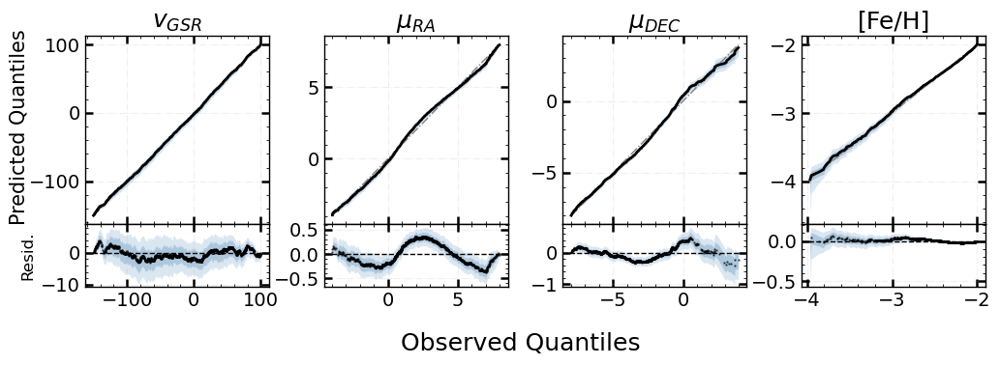

In [431]:
fig = plt.figure(figsize=(16*0.75, 4.5*0.75))
gs = fig.add_gridspec(2, 4, height_ratios=[3, 1], hspace=0.0, wspace=0.3)

st.set_presentation(True)

for idx in range(4):

    # --- Extract observed vector ---
    obs_vec = c19.all_memberships[summary_keys[idx]].to_numpy()
    obs_sorted = np.sort(obs_vec)
    n_obs = len(obs_sorted)

    # Prepare Q-grid for interpolation (common quantile axis)
    q = np.linspace(0, 1, n_obs)

    # --- Compute predictive quantiles for each posterior draw ---
    ppc_q = []   # will be shape (n_draws, n_obs)

    for mock in ppc_list:
        x = mock[summary_keys[idx]].to_numpy()
        x_sorted = np.sort(x)

        # Interpolate predictive distribution to shared q-grid
        ppc_q.append(
            np.interp(q, np.linspace(0, 1, len(x_sorted)), x_sorted)
        )

    ppc_q = np.array(ppc_q)    # (n_draws, n_quantiles)

    # --- Bayesian predictive envelopes ---
    rep_sorted   = np.median(ppc_q, axis=0)
    lower_sorted = np.percentile(ppc_q, 16, axis=0)
    upper_sorted = np.percentile(ppc_q, 84, axis=0)

    lower_sorted2 = np.percentile(ppc_q, 2.5, axis=0)
    upper_sorted2 = np.percentile(ppc_q, 97.5, axis=0)

    # --- residuals ---
    residuals = rep_sorted - obs_sorted

    # --- plot structure preserved exactly as yours ---
    ax_qq = fig.add_subplot(gs[0, idx])
    ax_res = fig.add_subplot(gs[1, idx], sharex=ax_qq)

    # Q-Q line (median predictive)
    ax_qq.plot(obs_sorted, rep_sorted, c='k', lw=2)
    ax_qq.set_title(f'{summary_labels[idx]}')

    # Shaded PPC ribbons
    ax_qq.fill_between(obs_sorted, lower_sorted, upper_sorted,
                       color='steelblue', alpha=0.3, zorder=0, linewidth=0)
    ax_qq.fill_between(obs_sorted, lower_sorted2, upper_sorted2,
                       color='steelblue', alpha=0.2, zorder=0, linewidth=0)

    # 1:1 line
    ax_qq.plot([obs_sorted[0], obs_sorted[-1]],
               [obs_sorted[0], obs_sorted[-1]],
               c='0.5', ls='-.', lw=1, zorder=0)

    ax_qq.tick_params(labelbottom=False)
    plot_form(ax_qq)

    # Residual plot
    ax_res.scatter(obs_sorted, residuals, c='k', s=0.5, alpha=0.6)
    ax_res.axhline(0, c='k', ls='--', lw=1)

    ax_res.fill_between(obs_sorted, lower_sorted - obs_sorted,
                        upper_sorted - obs_sorted,
                        color='steelblue', alpha=0.3, zorder=0, linewidth=0)
    ax_res.fill_between(obs_sorted, lower_sorted2 - obs_sorted,
                        upper_sorted2 - obs_sorted,
                        color='steelblue', alpha=0.2, zorder=0, linewidth=0)

    plot_form(ax_res)
    if idx == 0:
        ax_res.set_ylabel('Resid.', fontsize=12)

fig.supylabel('Predicted Quantiles', x=0.06, y=0.6, fontsize=15)
fig.supxlabel('Observed Quantiles', y=-0.1, fontsize=18)
plt.tight_layout()


In [432]:
_ci_cdf = {}

for key in summary_keys:
    rep_mean = np.sort(_ci['mean'][key])
    lower = np.sort(_ci['ci_lower'][key])
    upper = np.sort(_ci['ci_upper'][key])

    # Convert x uncertainty to y uncertainty (CDF)
    n = len(rep_mean)
    rep_cdf = np.linspace(0, 1, n)
    
    # For each bound, find where those values fall in the sorted mean distribution
    # This maps the value bounds back into cumulative-probability space
    lower_cdf = np.interp(lower, rep_mean, rep_cdf, left=0, right=1)
    upper_cdf = np.interp(upper, rep_mean, rep_cdf, left=0, right=1)
    
    _ci_cdf[key] = {
        'rep_mean': rep_mean,
        'rep_cdf': rep_cdf,
        'lower_cdf': lower_cdf,
        'upper_cdf': upper_cdf,
    }

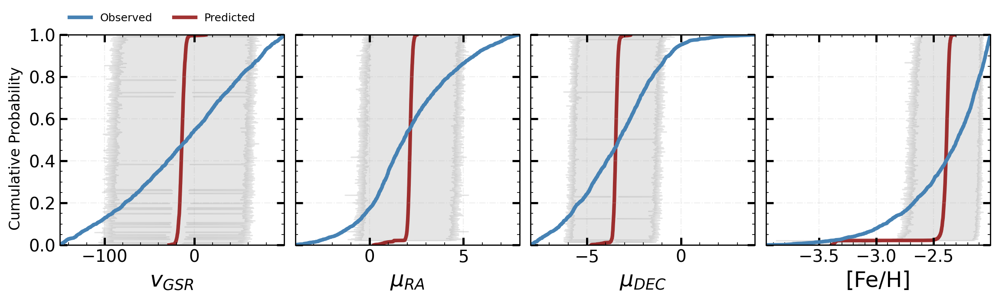

In [433]:
fig, axes = plt.subplots(1, 4, figsize=(13*0.9, 4*0.9), sharey=True)

for i, ax in enumerate(axes.flatten()):
    obs_sorted = np.sort(c19.all_memberships[summary_keys[i]])
    rep_sorted = np.sort(_ci['mean'][summary_keys[i]])
    
    # Get the confidence bounds in the SAME sort order as the mean
    sort_order = np.argsort(_ci['mean'][summary_keys[i]])
    upper_sorted = _ci['ci_upper'][summary_keys[i]].to_numpy()[sort_order]
    lower_sorted = _ci['ci_lower'][summary_keys[i]].to_numpy()[sort_order]
    
    # Compute CDFs
    obs_cdf = np.linspace(0, 1, len(obs_sorted), endpoint=False)
    rep_cdf = np.linspace(0, 1, len(rep_sorted), endpoint=False)
    
    # The CI bounds correspond to the same quantiles as rep_cdf
    # They just have different x-values (lower/upper bounds)
    
    # Plot CDF with credible interval
    ax.fill_betweenx(rep_cdf, lower_sorted, upper_sorted, 
                     color='0.5', alpha=0.2, zorder=0)
    
    ax.plot(obs_sorted, obs_cdf, color='steelblue', label='Observed', lw=3, zorder=2)
    ax.plot(rep_sorted, rep_cdf, color='darkred', label='Predicted', alpha=0.8, lw=3, zorder=1)
    
    ax.set_xlabel(f'{summary_labels[i]}')
    plot_form(ax)
    ax.set_xlim(np.nanmin(obs_sorted), np.nanmax(obs_sorted))
    ax.set_ylim(0, 1)
    

fig.supylabel('Cumulative Probability')
plt.tight_layout()
axes[0].legend(frameon=False, fontsize=9, ncol=3, loc='upper left', bbox_to_anchor=[0, 1.15, 0, 0])
plt.tight_layout()
fig.subplots_adjust(wspace=0.05)

In [434]:
# grouped_stream = samples_werr_big.groupby('phi1')[summary_keys]

# stream_ci = pd.concat(
#     {
#         'mean': grouped_stream.mean(),
#         'ci_lower': grouped_stream.quantile(0.025),
#         'ci_upper': grouped_stream.quantile(0.975),
#     },
#     axis=1,
# )


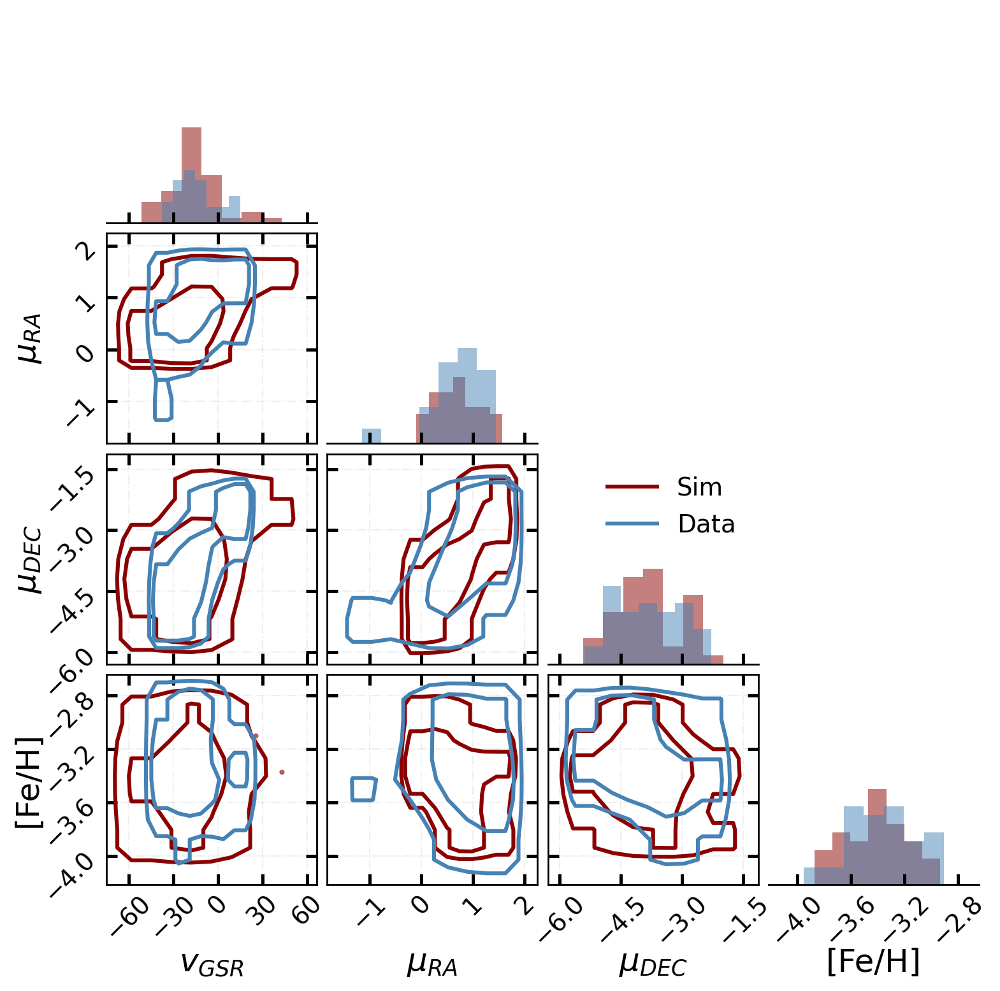

In [435]:
summary_keys = ['VGSR', 'PMRA', 'PMDEC', 'FEH']
summary_labels = [r'$v_{GSR}$', r'$\mu_{RA}$', r'$\mu_{DEC}$', r'[Fe/H]']#[f'{key}' for key in summary_keys]
# plt.style.use('dark_background')

def catalogue_means(df):
    return np.array([np.nanmean(df[key]) for key in summary_keys])

# samples = []
# for _ in range(n_draw):                       # or use len(posterior_idx)
#     _, cat_with_errors = draw_stream(np.arange(1, 19), c19.stream_data, n_samples=1)
#     samples.append(cat_with_errors)

# samples = np.array(summary_samples, dtype=float) 

_, samples_werr = draw_stream(np.arange(1, 19), c19.stream_data, n_samples=1)
observed = c19.stream_data.to_pandas()

# _, background_error_draw = draw_background(
#     np.arange(19, 27), background_stars, 1, c19.all_memberships
# )

sample_ = samples_werr

fig = corner.corner(
    samples_werr[summary_keys],
    labels=summary_labels,
    color='darkred',
    smooth=1.2,
    bins=7,
    levels=[0.68, 0.95],
    plot_density=False,
    plot_contours=True,
    plot_datapoints=True,
    hist_kwargs={"density": False, "color": "darkred", "histtype": "stepfilled", "alpha": 0.5, "range" : [np.nanmin(c19.stream_data.to_pandas()[summary_keys]), np.nanmax(c19.stream_data.to_pandas()[summary_keys])]},
    data_kwargs={"ms": 2, "alpha": 0.5,
                 "mec": "darkred"},
)

corner.corner(
    c19.stream_data.to_pandas()[summary_keys],
    labels=summary_labels,
    color='steelblue',
    smooth=1.2,
    bins=7,
    levels=[0.68, 0.95],
    plot_density=False,
    plot_contours=True,
    plot_datapoints=False,
    hist_kwargs={"density": False, "color": "steelblue", "histtype": "stepfilled", "alpha": 0.5, "range" : [np.nanmin(c19.stream_data.to_pandas()[summary_keys]), np.nanmax(c19.stream_data.to_pandas()[summary_keys])]},
    data_kwargs={"ms": 2, "alpha": 0.5,
                 "mec": "steelblue"},
    fig=fig
)

fig.set_size_inches(2 * len(summary_labels), 2 * len(summary_labels))


axes_grid = np.array(fig.axes).reshape(len(summary_labels), len(summary_labels))

ndim = len(summary_keys)
padding_scale=1.5
for i, ax in enumerate(fig.axes):
    row = i // ndim
    col = i % ndim
    if row == col:  # skip diagonal
        plot_form(ax)
        xlim = ax.get_xlim()
        
        x_center = (xlim[0] + xlim[1]) / 2
        x_range = xlim[1] - xlim[0]
        
        new_x_range = x_range * padding_scale
        
        ax.set_xlim(x_center - new_x_range/2, x_center + new_x_range/2)
        
        ax.tick_params(which="minor", color='1', length=0)
        continue

    plot_form(ax)
    ylim = ax.get_ylim()
    xlim = ax.get_xlim()
    
    y_center = (ylim[0] + ylim[1]) / 2
    y_range = ylim[1] - ylim[0]
    x_center = (xlim[0] + xlim[1]) / 2
    x_range = xlim[1] - xlim[0]
    
    new_y_range = y_range * padding_scale
    new_x_range = x_range * padding_scale
    
    ax.set_ylim(y_center - new_y_range/2, y_center + new_y_range/2)
    ax.set_xlim(x_center - new_x_range/2, x_center + new_x_range/2)
    
    ax.tick_params(which="minor", color='1', length=0)

for ax in np.diag(axes_grid):
    ylim = ax.get_ylim()
    ax.set_ylim(ylim[0], ylim[1]*2)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.tick_params(which="both", direction="in", top=False)
    ax.grid(alpha=0)
    

axes_grid[2,2].plot([], [], c='darkred', label='Sim')
axes_grid[2,2].plot([], [], c='steelblue', label='Data')
axes_grid[2,2].legend(frameon=False)


In [436]:
len(obs_sorted)

1875

In [437]:
# fig = plt.figure(figsize=(16, 4.5))
# gs = fig.add_gridspec(2, 4, height_ratios=[3, 1], hspace=0.0, wspace=0.3)

# for idx in range(4):
#     # Q-Q subplot
#     ax_qq = fig.add_subplot(gs[0, idx])
    
#     # Residual subplot
#     ax_res = fig.add_subplot(gs[1, idx], sharex=ax_qq)
    
#     obs_sorted = np.sort(c19.stream_data.to_pandas().drop_duplicates(subset='phi1')[summary_keys[idx]])
#     rep_sorted = np.sort(stream_ci['mean'].reset_index().drop_duplicates(subset='phi1')[summary_keys[idx]])
#     sort_order = np.argsort(stream_ci['mean'].reset_index().drop_duplicates(subset='phi1')[summary_keys[idx]]) 
    
#     upper_sorted = stream_ci['ci_upper'][summary_keys[idx]].to_numpy()[sort_order]
#     lower_sorted = stream_ci['ci_lower'][summary_keys[idx]].to_numpy()[sort_order]
    
#     # Calculate residuals
#     residuals = rep_sorted - obs_sorted
    
#     # Plot Q-Q
#     ax_qq.plot(obs_sorted, rep_sorted, c='k', lw=2)
#     ax_qq.set_title(f'{summary_labels[idx]}')
#     ax_qq.fill_between(obs_sorted, lower_sorted, upper_sorted, color='0.5', alpha=0.2, zorder=0)
#     ax_qq.plot(np.linspace(obs_sorted[0], obs_sorted[-1]), 
#               np.linspace(obs_sorted[0], obs_sorted[-1]), 
#               c='0.5', ls='-.', lw=1, zorder=0)
#     ax_qq.tick_params(labelbottom=False)
#     plot_form(ax_qq)
    
#     # Plot residuals
#     ax_res.scatter(obs_sorted, residuals, c='darkred', s=1, alpha=0.6)
#     ax_res.axhline(0, c='k', ls='--', lw=1)
#     ax_res.fill_between(obs_sorted, lower_sorted - obs_sorted, upper_sorted - obs_sorted, 
#                        color='0.5', alpha=0.2, zorder=0)
#     plot_form(ax_res)
    
#     if idx == 0:
#         ax_res.set_ylabel('Residual', fontsize=8)


# fig.supylabel('Predicted Quantiles', fontsize=10, x=0.08, y=0.6)
# fig.supxlabel('Observed Quantiles', fontsize=10)
# plt.tight_layout()

In [438]:
# fig, axes = plt.subplots(1, 4, figsize=(13*0.9, 4*0.9), sharey=True)

# for i, ax in enumerate(axes.flatten()):
#     obs_sorted = np.sort(c19.stream_data.to_pandas().drop_duplicates(subset='phi1')[summary_keys[i]])
#     rep_sorted = np.sort(stream_ci['mean'].reset_index().drop_duplicates(subset='phi1')[summary_keys[i]])
#     sort_order = np.argsort(stream_ci['mean'].reset_index().drop_duplicates(subset='phi1')[summary_keys[i]])

#     upper_sorted = stream_ci['ci_upper'].reset_index().drop_duplicates(subset='phi1')[summary_keys[i]].to_numpy()[sort_order]
#     lower_sorted = stream_ci['ci_lower'].reset_index().drop_duplicates(subset='phi1')[summary_keys[i]].to_numpy()[sort_order]

#     # Compute CDFs
#     obs_cdf = np.linspace(0, 1, len(obs_sorted))
#     rep_cdf = np.linspace(0, 1, len(rep_sorted))
    
#     # The CI bounds correspond to the same quantiles as rep_cdf
#     # They just have different x-values (lower/upper bounds)
    
#     # Plot CDF with credible interval
#     ax.fill_betweenx(rep_cdf, lower_sorted, upper_sorted, 
#                      color='0.5', alpha=0.2, zorder=0)
    
#     ax.plot(obs_sorted, obs_cdf, color='steelblue', label='Observed', lw=2, zorder=2)
#     ax.plot(rep_sorted, rep_cdf, color='darkred', label='Predicted', alpha=0.8, lw=2, zorder=1)
    
#     ax.set_xlabel(f'{summary_labels[i]}', fontsize=12)
#     plot_form(ax)
#     ax.set_xlim(np.nanmin(obs_sorted), np.nanmax(obs_sorted))
#     ax.set_ylim(0, 1)
    

# # # fig.supxlabel('Value')
# # for ax in axes.flatten()[1:]:
# #     ax.tick_params(labelcolor='white')

# fig.supylabel('Cumulative Probability', x=0.01)
# axes[0].legend(frameon=False, fontsize=9, ncol=3, loc='upper left', bbox_to_anchor=[0, 1.15, 0, 0])
# plt.tight_layout()
# fig.subplots_adjust(wspace=0.05)

In [439]:
# fig, axes = plt.subplots(1, 4, figsize=(14*0.9, 4*0.9))

# for i, ax in enumerate(axes.flatten()):
#     obs = c19.stream_data[summary_keys[i]]
#     rep = stream_ci['mean'][summary_keys[i]]
    
#     # ax.fill_betweenx(rep_cdf, lower_sorted, upper_sorted, 
#     #                  color='0.5', alpha=0.2, zorder=0)
    
#     ax.hist(obs, color='steelblue', bins=7, histtype='step', lw=2, range = [obs.min(), obs.max()], alpha=0.6)
#     ax.hist(rep, color='darkred', bins=7, histtype='step',   lw=2, range = [obs.min(), obs.max()], alpha=0.6)
    
#     ax.set_xlabel(f'{summary_labels[i]}', fontsize=13)
#     plot_form(ax)
#     # ax.set_xlim(np.nanmin(obs), np.nanmax(obs))
#     # ax.set_ylim(0, 1)
    

# fig.supylabel('Cumulative Probability', fontsize=13)
# plt.tight_layout()
# axes[0].legend(frameon=False, fontsize=9, ncol=3, loc='upper left', bbox_to_anchor=[0, 1.15, 0, 0])
# plt.tight_layout()
# # fig.subplots_adjust(wspace=0.15)

# Multi Panel

In [78]:
import streamTutorial as st
st.set_presentation(True)

In [153]:
gals = mwsts.get('M92-I21')
gal_phi1, gals_phi2 = stream_funcs.ra_dec_to_phi1_phi2(c19.frame, gals.track.ra.value*u.deg, gals.track.dec.value*u.deg)

In [154]:
gal_dist = gals.track.distance.value

No orbit results found, skipping orbit track plotting
/Users/nasserm/Documents/vscode/research/streamTut/DESI_loa_c19/post_mcmc.py:2696: UserWarning: Rasterization of 'Spine' will be ignored
  if data is None or sel is None:



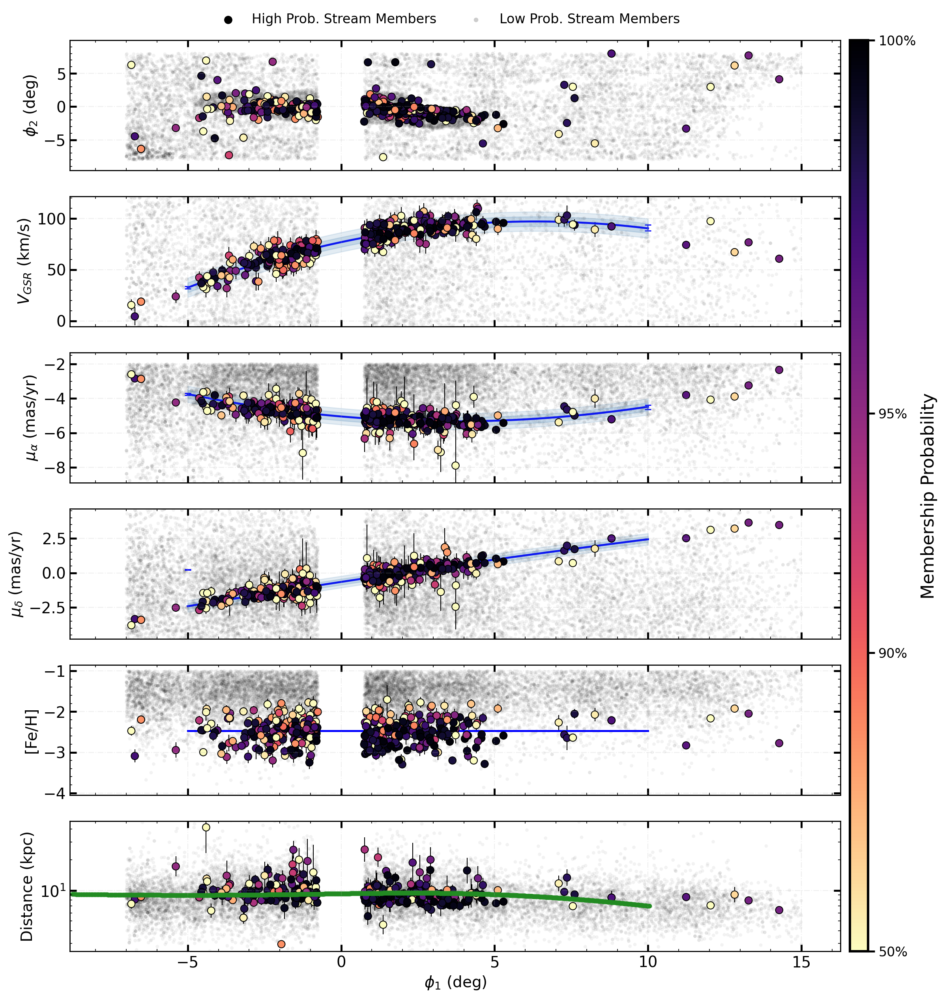

In [156]:
fig, ax = c19.vis_6_panel(addBackground=True, save_fig=False, show_pm_dispersion=True, show_vgsr_dispersion=True, dist_mod_panel=True, min_prob=0.5)

# ax[0].scatter(c19.stream_data['phi1'][c19.stream_data['SOURCE_ID'] == 2760807387346283648], c19.stream_data['phi2'][c19.stream_data['SOURCE_ID'] == 2760807387346283648], marker='X', s=100, color='red')


ax[0].scatter([],[], c='k', label='High Prob. Stream Members'),
ax[0].scatter([],[], c='0.8', s=10, label='Low Prob. Stream Members'),

# ax[0].set_xlim(-50, 50)
# ax[1].set_ylim(-75, 75)
# ax[2].set_ylim(-1, 3)
# ax[5].set_ylim(0, 55)
ax[0].legend(ncol=3, bbox_to_anchor=(0.49, 1.3), loc='upper center', frameon=False, fontsize=12)

gal_dist_mod = 5 * np.log10(gal_dist) - 5  # distance in kpc
ax[5].scatter(gal_phi1, gal_dist, color='forestgreen', s=10, label='M92-I21 Model')




In [80]:
c19.all_memberships.keys()

Index(['TARGET_RA', 'TARGET_DEC', 'FEH', 'FEH_ERR', 'LOGG', 'TARGETID', 'VRAD',
       'PRIMARY', 'TEFF', 'VRAD_ERR', 'PARALLAX_ERROR', 'PMDEC_ERROR',
       'PHOT_BP_MEAN_FLUX', 'PMRA_ERROR', 'PMRA', 'PARALLAX', 'PMDEC',
       'PMRA_PMDEC_CORR', 'SOURCE_ID', 'PHOT_RP_MEAN_FLUX', 'dist_mod',
       'dist_mod_err', 'FLUX_Z', 'FLUX_R', 'FLUX_G', 'EBV',
       'dist_mod_err_right', 'dist_mod_right', 'VGSR', 'phi1', 'phi2',
       'stream_prob', 'stream_prob_em', 'stream_prob_ep'],
      dtype='object')

In [81]:
# all_memberships r mag
stream_colour_index, _, stream_r_mag = stream_funcs.get_colour_index_and_abs_mag(
                    c19.all_memberships['EBV'], c19.all_memberships['FLUX_G'], c19.all_memberships['FLUX_R'], None
                )
c19.all_memberships['r_mag'] = stream_r_mag

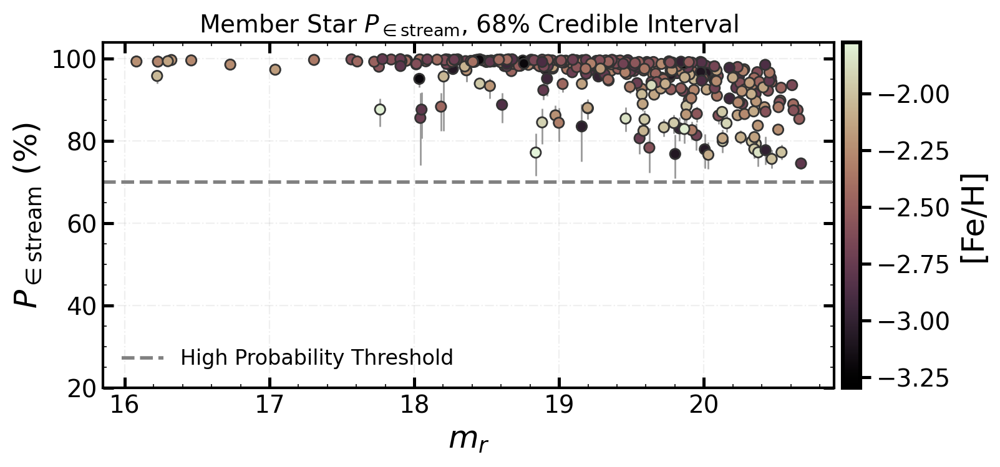

In [118]:
import cmasher as cmr
stream_prob = c19.all_memberships['stream_prob'].to_numpy()
stream_prob_em = c19.all_memberships['stream_prob_em'].to_numpy()
stream_prob_ep = c19.all_memberships['stream_prob_ep'].to_numpy()
post_df = c19.all_memberships
high_prob = stream_prob_em > 0.7

x = stream_r_mag[high_prob]
y = stream_prob[high_prob]

xerr = np.vstack([
    stream_prob[high_prob] - stream_prob_em[high_prob],
    stream_prob_ep[high_prob] - stream_prob[high_prob],
])

fig, ax = plt.subplots(1, 1, figsize=(6*1.5, 2*1.8))

ax.errorbar(
    x, y*100,
    yerr=xerr*100,
    xerr=None,
    fmt='none',
    ecolor='0.6',
    elinewidth=1,
    capsize=0,
)

sc = ax.scatter(
    x, y*100,
    c=post_df['FEH'][high_prob],
    cmap=cmr.sepia,
    s=35,
    edgecolors='0.2',
    linewidths=1,zorder=5
)

# plt.colorbar(sc, ax=ax, pad=0.01)

ax.set_xlabel(r'$m_r$')
ax.set_ylabel(r'$P_{\in \text{stream}}$ (%)')
ax.set_title(r'Member Star $P_{\in \text{stream}}$, 68% Credible Interval', fontsize=14)
ax.set_ylim(20, 104)
#label cbar as g-r, put cbar horizontal on top, fontsize 12
ax.figure.colorbar(sc, ax=ax, label='[Fe/H]', pad=0.01)
ax.axhline(70, ls='--', color='0.5', lw=2, label='High Probability Threshold')
ax.legend(frameon=False, fontsize=12)
stream_funcs.plot_form(ax)
for spine in ax.spines.values():
    spine.set_linewidth(1.5)

# #rasterize and save
# for ax in fig.axes:
#     for artist in ax.collections:  # scatter, contourf, etc.
#         artist.set_rasterized(True)

# fig.savefig('./figs/mem_ci.pdf', dpi=300)



In [271]:
c19.print_meds()

param             med         em         ep   exp(med)    exp(em)    exp(ep)
--------------------------------------------------------------------------------------
pstream         0.019     -0.003      0.003
vgsr1          24.801    -12.605     12.497
vgsr2          -9.576     -4.026      4.250
vgsr3         -16.311     -4.527      4.767
vgsr4         -18.243     -2.346      2.629
vgsr5         -34.382    -11.804     10.695
lsigvgsr        0.892     -0.080      0.077      7.803     -1.319      1.510
feh1           -3.368     -0.044      0.046
lsigfeh        -0.640     -0.069      0.078      0.229     -0.034      0.045
pmra1           1.172     -0.202      0.187
pmra2           1.265     -0.096      0.086
pmra3           0.909     -0.090      0.092
pmra4           0.738     -0.049      0.052
pmra5          -0.151     -0.263      0.252
pmdec1         -2.542     -0.184      0.211
pmdec2         -3.050     -0.075      0.073
pmdec3         -3.607     -0.082      0.108
pmdec4         -4.136 

Not applying BHB cut
Not applying BHB cut


(0.0, 0.9)

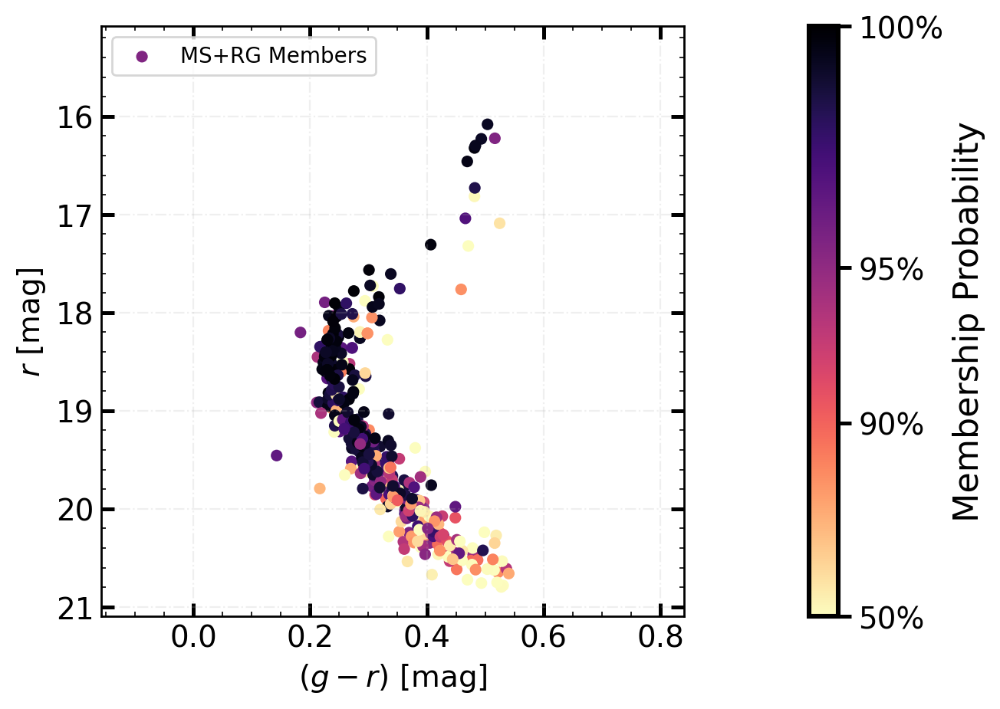

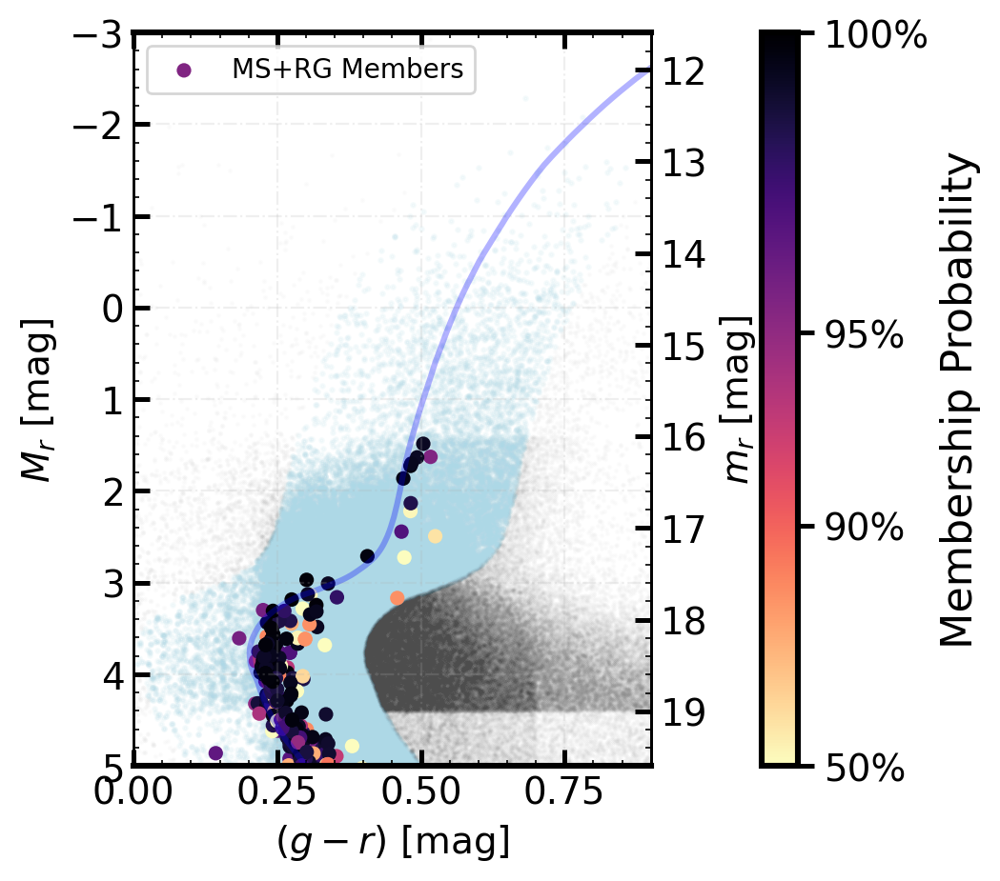

In [88]:
# Apparent r vs (g-r)
fig, ax = c19.vis_isochrone(
    isochrone_path='/Users/nasserm/Documents/vscode/research/streamTut/DESI-DR1_streamTutorial/data/dotter/iso_a13.5_z0.00009.dat',
    color_index_wiggle=0.2, absolute=False, return_axes=True
)


# ax.legend(bbox_to_anchor=(0.01, 1.21), loc='upper left', fontsize=10)


# Absolute r vs (g-r)
fig, ax = c19.vis_isochrone(
    isochrone_path='/Users/nasserm/Documents/vscode/research/streamTut/DESI-DR1_streamTutorial/data/dotter/iso_a13.5_z0.00009.dat',
    color_index_wiggle=0.2, absolute=True, return_axes=True, horizontal_branch=False
)
ax.scatter([], [], s=5, c='skyblue', marker='o', label='Included in GMM')
fig.set_size_inches(5, 5)
ax.set_xlim(0.0, 0.9)

# ax.legend()


# Orbit

In [216]:
o_known= Orbit.from_name('M-92')

In [164]:
o_known.ra()

259.28100000000006

In [171]:
stream_data['RA'] = np.array(c19.stream_data['TARGET_RA'])
stream_data['DEC'] = np.array(c19.stream_data['TARGET_DEC'])

In [ ]:
import orbit_functions as ofuncs
#--------Select how many Gyrs you want to fit for-------------#
fw = np.linspace(0., 0.1, 1001) * u.Gyr
bw = np.linspace(0., -0.1, 1001) * u.Gyr
#------------------------------------------------------------#

known_object = True
if not known_object:

    #--------Set the distance of your progenitor-------------#
    progenitor_dist = 8.3 #c19.min_dist # in kpc
    #--------------------------------------------------------#

    stream_data['RA'] = np.array(c19.stream_data['TARGET_RA'])
    stream_data['DEC'] = np.array(c19.stream_data['TARGET_DEC'])

    progenitor_ra = np.nanmean(stream_data['RA'])
    distances = np.abs(stream_data['RA'] - progenitor_ra)

    k = np.argsort(distances)
    guess = {
        'DEC': np.nanmean(stream_data[k]['DEC'][:2]),
        'PMRA': np.nanmean(stream_data[k]['PMRA'][:2]),
        'PMDEC': np.nanmean(stream_data[k]['PMDEC'][:2]),
        'VRAD': np.nanmean(stream_data[k]['VRAD'][:2]),
        'DIST': progenitor_dist
    }

    guess['VGSR'] = ofuncs.vhel_to_vgsr(progenitor_ra*u.deg, guess['DEC']*u.deg, guess['VRAD']*u.km/u.s).value

else:
    progenitor_dist = o_known.dist()
    progenitor_ra = o_known.ra()
    guess = {
        'DEC': o_known.dec().value,
    }


# Prepare theta (initial guess array including log sigmas)
# You might need to adjust these initial log sigma values
lsig_dec_init = np.log10(0.1)  # Example: log10(0.1 deg)
lsig_pmra_init = np.log10(0.1) # Example: log10(0.1 mas/yr)
lsig_pmdec_init = np.log10(0.1)# Example: log10(0.1 mas/yr)
lsig_vrad_init = np.log10(1.0) # Example: log10(1 km/s)

theta_init = [
    guess['DEC'],
    guess['PMRA'],
    guess['PMDEC'],
    guess['VRAD'],
    guess['DIST'],
    lsig_dec_init,
    lsig_pmra_init,
    lsig_pmdec_init,
    lsig_vrad_init
]


# Corrected call to fit_orbit with theta_init and arguments in the right order
#result_o, orbit = ofuncs.fit_orbit(stream_data, fr, progenitor_ra, fw, bw, theta_init, use_position=True)


In [64]:
progenitor_ra

260.1536588819088

In [65]:
progenitor_ra = np.nanmean(c19.stream_data['RA'])

results_o, orbit, fig, ax = c19.do_orbit(
    progenitor_RA=progenitor_ra,
    with_plot=False,
    theta_init=theta_init,
    fw=fw,
    bw=bw,
    use_mcmc=False)#,
#     plot_chains=True,
#     nwalkers=40,
#     nburn=100,
#     nsteps=500,
# )

orbit parameters ['dec', 'pmra', 'pmdec', 'vrad', 'dist', 'lsig_dec', 'lsig_pmra', 'lsig_pmdec', 'lsig_vrad']
intital guess [44.696254842850465, -5.475765875912632, -0.7497036240055519, -114.61857009164214, 8.3, -1.0, -1.0, -1.0, 0.0]
Optimization results_o:
Success: True
Status: 0
Message: Optimization terminated successfully.
Function Value: 4511.950230263704
Number of Iterations: 4
Number of Function Evaluations: 633
Progenitor
dec: 42.99 deg
pmra: -6.63 mas / yr
pmdec: -0.75 mas / yr
vrad: -114.62 km / s
dist: 8.30 kpc
lsig_dec: 8.60 deg
lsig_pmra: 1.08 mas / yr or 42.55 km / s
lsig_pmdec: 0.85 mas / yr or 33.35 km / s
lsig_vrad: 27.50 km / s
Pericenter: 0.81 kpc 
Apocenter: 10.31 kpc
Orbital period: 0.14


In [66]:
len(c19.stream_data)

402

In [67]:
# convert progenitor_RA, 2.81 deg  to phi_1, phi2

stream_funcs.ra_dec_to_phi1_phi2(c19.frame, progenitor_ra*u.deg, guess['DEC']*u.deg)

(0.882402044193371, 1.4322572455193665)

In [68]:
from galpy.orbit import Orbit
from galpy.potential import MWPotential2014

In [69]:
results_o.x[0:4]

array([  42.99175452,   -6.62725585,   -0.75406315, -114.61977908])

In [70]:
vgsr = ofuncs.vhel_to_vgsr(
    progenitor_ra * u.deg,
    results_o.x[0] * u.deg,
    results_o.x[3] * u.km / u.s
).value
print(vgsr)

82.36109563319111


In [71]:
progenitor_ra

260.1536588819088

In [225]:
# o_ = Orbit(vxvv = [progenitor_ra, results_o.x[0], results_o.x[4], *results_o.x[1:4]], radec=True)
ts = np.linspace(0, 0.1, 2002) * u.Gyr
o_known.integrate(ts, MWPotential2014)
o_2 = Orbit.from_name('M-92')
tb = np.linspace(0, -0.1, 2002) * u.Gyr
o_2.integrate(tb, MWPotential2014)
# o_r = o_.r(np.linspace(-0.2, 0.2, 2002) * u.Gyr)

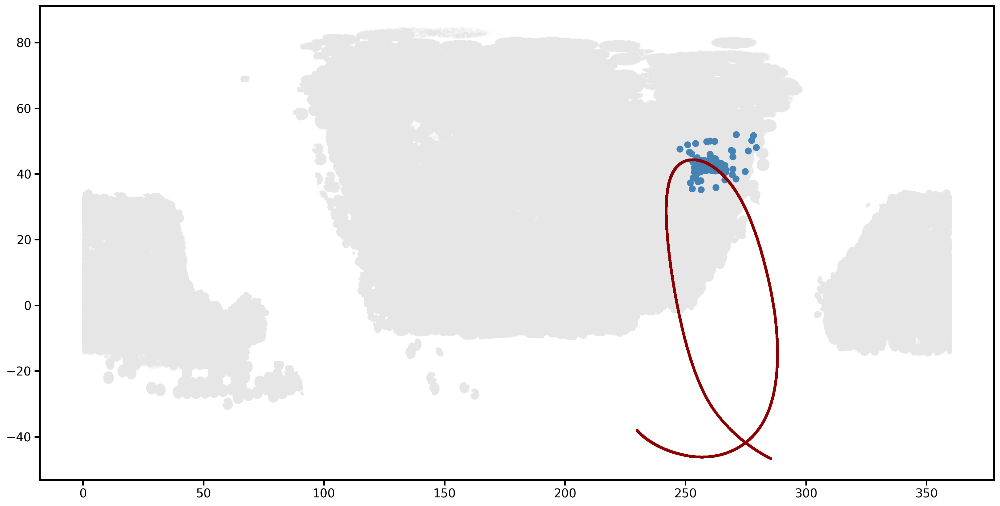

In [226]:
fig, ax = plt.subplots(
    1, 1,
    figsize=(20, 10),
)
ax.scatter(c19.stream_data['RA'], c19.stream_data['DEC'], s=50, c='steelblue', label='Stream Data', zorder=1)
ax.scatter(c19.desi_data['TARGET_RA'], c19.desi_data['TARGET_DEC'], s=5, c='0.9', label='DESI Field Stars', alpha=0.01, zorder=0)

ax.scatter(o_known.ra(ts), o_known.dec(ts), c='darkred', s=5, label='M92-I21 Orbit', zorder=2)
ax.scatter(o_2.ra(tb), o_2.dec(tb), c='darkred', s=5, zorder=2)


TypeError: '>' not supported between instances of 'method' and 'int'

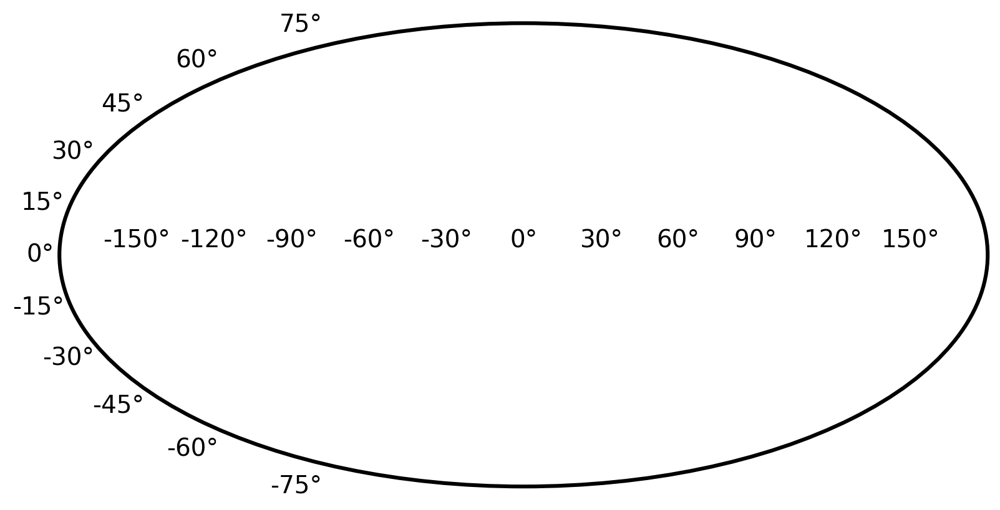

In [172]:
importlib.reload(ofuncs)
o_ra, o_dec, o_pmra, o_pmdec, o_vrad, o_dist, o = o_known.ra, o_known.dec(), o_known.pmra(), o_known.pmdec(), o_known.vlos(), o_known.dist(), o_known

# o_ = Orbit(vxvv = [progenitor_ra, results_o.x[0], results_o.x[4], *results_o.x[1:4]], radec=True)
# o_.integrate(np.linspace(-0.2, 0.2, 2002) * u.Gyr, MWPotential2014)
# o_r = o_.r(np.linspace(-0.2, 0.2, 2002) * u.Gyr)

fig, ax = ofuncs.plot_orbit(o_ra, o_dec, stream_data['RA'], stream_data['DEC'], progenitor_ra, model_dist=o_known.ra, cmap='brg', cbar_label='Spherical Galactocentric Distance [kpc]')
shift_ra = ofuncs.zero_360_to_180(c19.desi_data['TARGET_RA'])
ax.scatter(np.radians(shift_ra), np.radians(c19.desi_data['TARGET_DEC']), alpha=0.025, s=0.02, zorder=0, c='0.8')

ax.plot([], [], c='red',label='MW2014 Orbit')
ax.scatter([],[], c='k', label='This Work', s=20)
ax.scatter([],[], c='0.5', label='DESI YR3-Bright Program', s=5)
ax.legend(loc='upper right', fontsize=11)

# increase x/y label and tick font sizes to 9 (works if ax is single Axes or array-like)
axes = ax if hasattr(ax, "__iter__") else [ax]
for a in np.ravel(axes):
    xlabel = a.get_xlabel()
    ylabel = a.get_ylabel()
    if xlabel:
        a.set_xlabel(xlabel, fontsize=11)
    if ylabel:
        a.set_ylabel(ylabel, fontsize=11)
    a.tick_params(axis='both', which='major', labelsize=11)
    a.tick_params(axis='both', which='minor', labelsize=11)



# for ax in fig.axes:
#     for artist in ax.collections:  # scatter, contourf, etc.
#         artist.set_rasterized(True)

# # fig_path = c19.stream_run_directory + '/moll.svg'
# # fig.savefig(fig_path, bbox_inches='tight', dpi=400, transparent=False)
# # print(f'Saved rasterized PDF: {fig_path}')


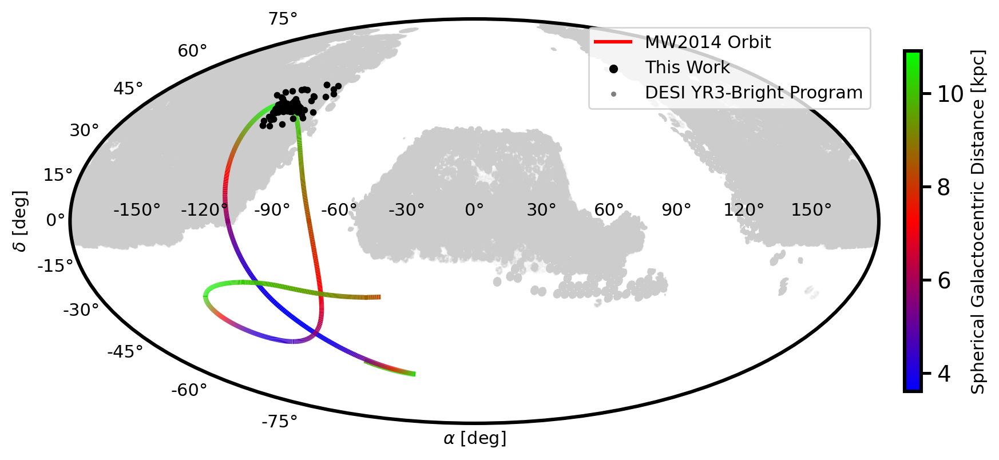

In [ ]:
importlib.reload(ofuncs)
o_ra, o_dec, o_pmra, o_pmdec, o_vrad, o_dist, o = ofuncs.orbit_model(results_o.x[0:5], progenitor_ra, fw, bw, return_o=True)

o_ = Orbit(vxvv = [progenitor_ra, results_o.x[0], results_o.x[4], *results_o.x[1:4]], radec=True)
o_.integrate(np.linspace(-0.2, 0.2, 2002) * u.Gyr, MWPotential2014)
o_r = o_.r(np.linspace(-0.2, 0.2, 2002) * u.Gyr)

fig, ax = ofuncs.plot_orbit(o_ra, o_dec, stream_data['RA'], stream_data['DEC'], progenitor_ra, model_dist=o_r, cmap='brg', cbar_label='Spherical Galactocentric Distance [kpc]')
shift_ra = ofuncs.zero_360_to_180(c19.desi_data['TARGET_RA'])
ax.scatter(np.radians(shift_ra), np.radians(c19.desi_data['TARGET_DEC']), alpha=0.025, s=0.02, zorder=0, c='0.8')

ax.plot([], [], c='red',label='MW2014 Orbit')
ax.scatter([],[], c='k', label='This Work', s=20)
ax.scatter([],[], c='0.5', label='DESI YR3-Bright Program', s=5)
ax.legend(loc='upper right', fontsize=11)

# increase x/y label and tick font sizes to 9 (works if ax is single Axes or array-like)
axes = ax if hasattr(ax, "__iter__") else [ax]
for a in np.ravel(axes):
    xlabel = a.get_xlabel()
    ylabel = a.get_ylabel()
    if xlabel:
        a.set_xlabel(xlabel, fontsize=11)
    if ylabel:
        a.set_ylabel(ylabel, fontsize=11)
    a.tick_params(axis='both', which='major', labelsize=11)
    a.tick_params(axis='both', which='minor', labelsize=11)



# for ax in fig.axes:
#     for artist in ax.collections:  # scatter, contourf, etc.
#         artist.set_rasterized(True)

# # fig_path = c19.stream_run_directory + '/moll.svg'
# # fig.savefig(fig_path, bbox_inches='tight', dpi=400, transparent=False)
# # print(f'Saved rasterized PDF: {fig_path}')


In [284]:
o_ = Orbit(vxvv = [progenitor_ra, results_o.x[0], results_o.x[4], *results_o.x[1:4]], radec=True)

In [285]:
ap = o_.rap(analytic=True, pot=MWPotential2014)
print(ap)

21.473695358556586


In [286]:
peri = o_.rperi(analytic=True, pot=MWPotential2014)
print(peri)

10.199958054068542


In [287]:
ecc = (ap - peri) / (ap + peri)
print(ecc)

0.3559342257623596


In [288]:
display(results_o.corner)

None

In [289]:
c19.stream_run_directory + '/orbit_results.pkl'

'/Users/nasserm/Documents/vscode/research/streamTut/DESI_loa_c19/runs/C-19-I21_260112_old_photometry_const_uniformprior_DES_ext_1_spline/orbit_results.pkl'

In [290]:
# save orbit results to stream directory
import pickle
with open(c19.stream_run_directory + '/orbit_results.pkl', 'wb') as f:
    pickle.dump({'results_o': results_o, 'orbit': orbit}, f)
# with open(c19.stream_run_directory + 'orbit_results.pkl', 'rb') as f:
#     data = pickle.load(f)
# results_o = data['results_o']
# orbit = data['orbit']

# Box Cut

In [363]:
st.set_presentation(False)

In [228]:
c19.bhb_handler.data = c19.bhb_handler.data.drop_duplicates(subset='TARGETID', keep='first').reset_index(drop=True)



Applying box cuts...
Not applying BHB cut
Box cuts applied. Access total masks using StreamMembers.<handler>.sel
Plotting box cuts...


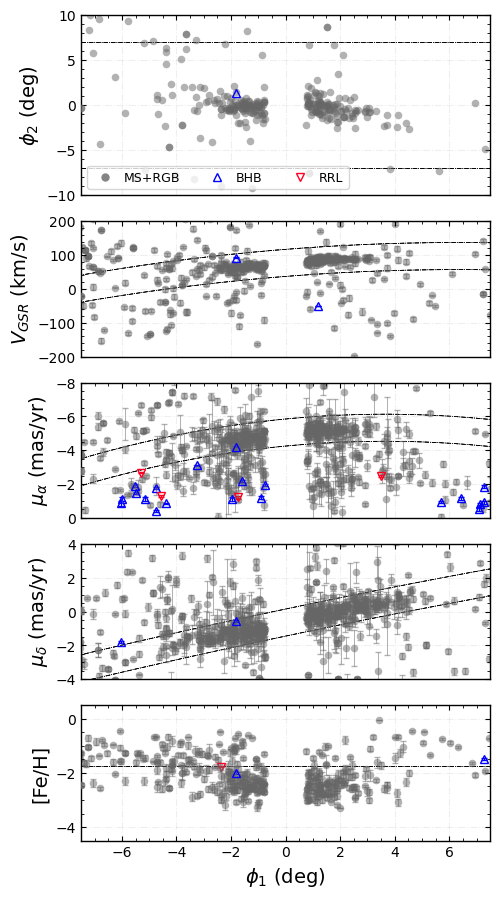

In [364]:
fig, ax = c19.box_cut(pad=np.array([40., -1.75, 0.8, 0.8, 7.]), # vgsr, feh, pmra, pmdec, phi2 #[40., -2.25, 0.5, 0.5, 7.]
            withIso=True,    # keep the isochrone filter on
            withAss=False, residual=False, 
            show_panels=[0, 1,2,3,4],
            phi1_exclude=(-0.75, 0.75),
            ylim_phi2=(-10, 10),
            ylim_vgsr=(-200, 200),
            ylim_pmra=(0, -8),
            ylim_pmdec=(-4, 4), ylim_feh=(-4.5, 0.5)
            )    # glue on the HB allowance

# change marker colour to blue



for a in ax:
    a.set_xlim(-7.5, 7.5)

# ax[4].set_ylim(-4.25, -1.)

# #save fig as rasterized PDF
# fig_path = './figs/box_cut.pdf'
# #rasterize
# for ax_i in ax:
#     for line in ax_i.get_lines():
#         line.set_rasterized(True)
# fig.savefig(fig_path, bbox_inches='tight', dpi=400, transparent=False)
# print(f'Saved rasterized PDF: {fig_path}')

In [230]:
# fig, ax = c19.box_cut(pad=np.array([40., -2.25, 0.5, 0.5, 7.]), # vgsr, feh, pmra, pmdec, phi2
#             withIso=True,    # keep the isochrone filter on
#             withAss=False, residual=False, 
#             show_panels=[0,5])    # glue on the HB allowance

# ax[0].set_ylim(-7, 7)

In [231]:
len(c19.ms_handler.data[c19.ms_handler.sel]['phi1'])

280

In [232]:
# print how many of c19.ms_handler.data[c19.ms_handler.sel] are in c19.data.stream_data
print(f"Number of members in ms_handler data: {len(c19.ms_handler.data[c19.ms_handler.sel])}")
print(f"Number of members in stream_data: {len(c19.stream_data)}")

#cross match
matched = pd.merge(
    c19.ms_handler.data[c19.ms_handler.sel],
    c19.stream_data.to_pandas(),
    on='TARGETID',
    suffixes=('_ms', '_stream')

)
print(f"Number of matched members: {len(matched)}")


Number of members in ms_handler data: 280
Number of members in stream_data: 402
Number of matched members: 209


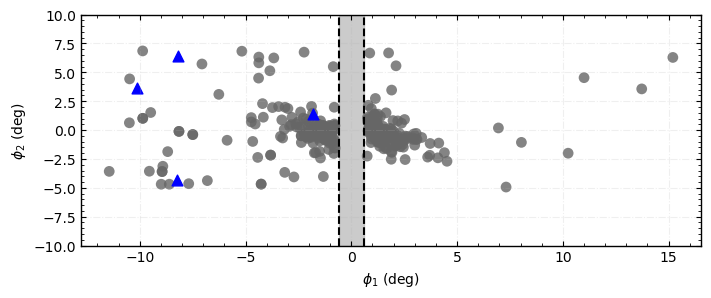

In [381]:
st.set_presentation(False)
fig, ax = plt.subplots(1, 1, figsize=(8, 3))
ax.scatter(c19.ms_handler.data[c19.ms_handler.sel]['phi1'], c19.ms_handler.data[c19.ms_handler.sel]['phi2'], s=60, edgecolors='none', facecolors='0.4', alpha=0.8)
ax.scatter(c19.bhb_handler.data[c19.bhb_handler.sel]['phi1'], c19.bhb_handler.data[c19.bhb_handler.sel]['phi2'], s=60, edgecolors='b', facecolors='blue', marker='^')

ax.axvline(0.6, ls='--', color='0', lw=1.5)
ax.axvline(-0.6, ls='--', color='0', lw=1.5)
ax.fill_betweenx([-10, 10], -0.6, 0.6, color='0.6', alpha=0.5, zorder=0)

ax.set_ylabel(r'$\phi_2$ (deg)')
ax.set_xlabel(r'$\phi_1$ (deg)')
ax.set_ylim(-10, 10)
plot_form(ax)

In [236]:
box_cut = c19.box_data

In [249]:
gal_dist

array([9.15794152, 9.15650448, 9.15507393, ..., 7.01289495, 7.00610482,
       6.99930276])

In [ ]:
dist_mod_progenitor = 5*np.log10(8.6*1000)-5

14.67249225621784

In [348]:
from scipy.interpolate import interp1d

phi1_arr = np.linspace(-7, 7)
interp_dist = interp1d(gal_phi1, gal_dist, kind='linear',fill_value="extrapolate")

stream_colour_index = []
stream_r_mag = []
stream_abs_mag = []

for ebv, flux_g, flux_r, dist in zip(
    box_cut["EBV"].to_numpy(),
    box_cut["FLUX_G"].to_numpy(),
    box_cut["FLUX_R"].to_numpy(),
    interp_dist(box_cut["phi1"].to_numpy()),
):
    ci, abs_mag, rmag = stream_funcs.get_colour_index_and_abs_mag(
        ebv, flux_g, flux_r, dist*1000
    )
    stream_colour_index.append(ci)
    stream_r_mag.append(rmag)
    stream_abs_mag.append(abs_mag)


mem_colour_index = []
mem_r_mag = []
mem_abs_mag = []   

for ebv, flux_g, flux_r, dist in zip(
    c19.stream_data["EBV"],
    c19.stream_data["FLUX_G"],
    c19.stream_data["FLUX_R"],
    interp_dist(c19.stream_data["phi1"]),
):
    ci, abs_mag, rmag = stream_funcs.get_colour_index_and_abs_mag(
        ebv, flux_g, flux_r, dist*1000
    )
    mem_colour_index.append(ci)
    mem_r_mag.append(rmag)
    mem_abs_mag.append(abs_mag)

desi_colour_index, desi_abs_mag, desi_r_mag = stream_funcs.get_colour_index_and_abs_mag(c19.all_memberships['EBV'], c19.all_memberships['FLUX_G'], c19.all_memberships['FLUX_R'], 8.6*1000)

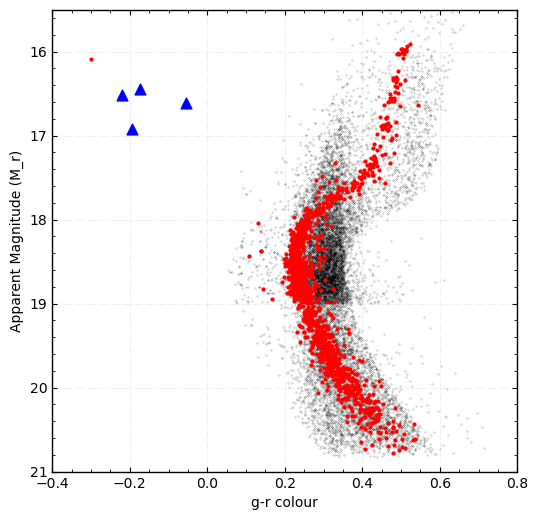

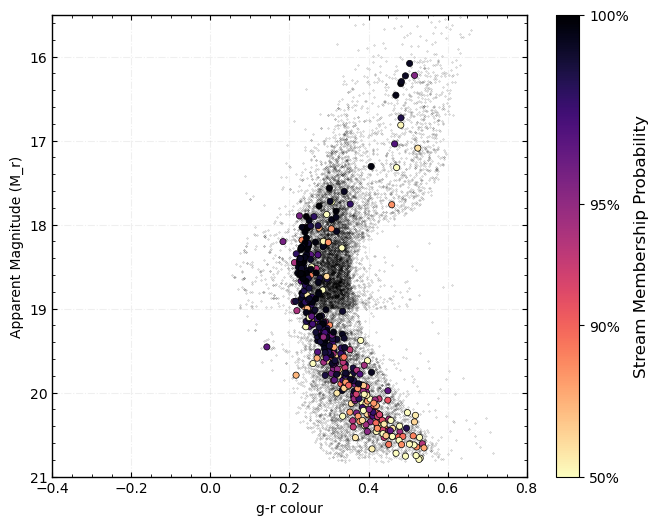

In [ ]:
st.set_presentation(False)
fig, ax = plt.subplots(figsize=(6, 6))

ax.scatter(stream_colour_index, stream_r_mag, s=4, zorder=4, marker='o', c='red')
ax.scatter(bhb_colour_index, bhb_r_mag, s=60, edgecolors='b', facecolors='blue', marker='^', zorder=5)  
ax.scatter(desi_colour_index, desi_r_mag, s=0.05, alpha=0.5, c='k', zorder=0)
ax.invert_yaxis()

ax.set_xlim(-0.4, 0.8)
ax.set_ylim(21, 15.5)
ax.set_xlabel('g-r colour')
ax.set_ylabel('Apparent Magnitude (M_r)')
stream_funcs.plot_form(ax)



import matplotlib.ticker as mtick
from matplotlib.colors import PowerNorm

fig, ax = plt.subplots(figsize=(7.65, 6))

# Set min/max for normalization
min_prob = 0.5
max_prob = 1.0

# PowerNorm for nonlinear color scaling
norm = PowerNorm(gamma=5, vmin=min_prob, vmax=max_prob)

sc = ax.scatter(
    mem_colour_index, mem_r_mag, s=20, zorder=4, marker='o',
    c=c19.stream_data['stream_prob'], label='Stream Members',
    cmap='magma_r', edgecolors='k', linewidths=0.5, norm=norm
)
ax.scatter(desi_colour_index, desi_r_mag, s=0.05, alpha=0.5, c='k', zorder=0)

# show cbar with % formatting and custom ticks
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Stream Membership Probability', fontsize=12)
cbar.ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))

# Set ticks at key probability values
ticks = [min_prob, 0.9, 0.95, 1.0]
cbar.set_ticks([t for t in ticks if t >= min_prob and t <= max_prob])

ax.set_xlim(-0.4, 0.8)
ax.set_ylim(21, 15.5)
ax.set_xlabel('g-r colour')
ax.set_ylabel('Apparent Magnitude (M_r)')
stream_funcs.plot_form(ax)

In [330]:
# # Apparent r vs (g-r)
# fig, ax = c19.vis_isochrone(
#     isochrone_path='/Users/nasserm/Documents/vscode/research/streamTut/DESI-DR1_streamTutorial/data/dotter/iso_a13.5_z0.00009.dat',
#     color_index_wiggle=1e-5, absolute=False, return_axes=True, box_cut=True
# )

# fig, ax = c19.vis_isochrone(
#     isochrone_path='/Users/nasserm/Documents/vscode/research/streamTut/DESI-DR1_streamTutorial/data/dotter/iso_a13.5_z0.00009.dat',
#     color_index_wiggle=0.2, absolute=True, return_axes=True, box_cut=True
# )
# ax.scatter([], [], s=5, c='skyblue', marker='o', label='Included in GMM')
# ax.set_ylim(1, 10)
# # ax.legend()


In [341]:
# # # Apparent r vs (g-r)
# # fig, ax = c19.vis_isochrone(
# #     isochrone_path='/Users/nasserm/Documents/vscode/research/streamTut/DESI-DR1_streamTutorial/data/dotter/iso_a13.5_z0.00006.dat',
# #     color_index_wiggle=1e-5, absolute=False, return_axes=True, horizontal_branch=True
# # )

# # ax.scatter(yuan_colour_index, yuan_r_mag, s=100, facecolor='none', edgecolor='k', marker='D', label='Prev. RV Members $\in$ DESI')
# # ax.legend(loc = 'upper left', bbox_to_anchor=(-0.05, 1.1), fontsize=10, ncol=3, frameon=False)
# # ax.set_xlim(-0.235, 0.9)
# # # ax.legend(bbox_to_anchor=(0.01, 1.21), loc='upper left', fontsize=10)


# # Absolute r vs (g-r)
# fig, ax = c19.vis_isochrone(
#     isochrone_path='/Users/nasserm/Documents/vscode/research/streamTut/DESI-DR1_streamTutorial/data/dotter/iso_a13.5_z0.00009.dat',
#     color_index_wiggle=0.2, absolute=True, return_axes=True, horizontal_branch=False
# )
# # ax.scatter(yuan_colour_index, yuan_abs_mag, s=100, facecolor='none', edgecolor='k', marker='D', label='Prev. RV Members $\in$ DESI')
# #plot bhbs

# ax.scatter([], [], s=5, c='skyblue', marker='o', label='Included in GMM')


# ax.set_xlim(-0.335, 1)
# ax.set_ylim(8, -2)
# ax.legend(loc = 'upper left', bbox_to_anchor=(-0.05, 1.15), fontsize=10, ncol=2, frameon=False)
# # rasterize and save fig as PDF
# # fig_path = './figs/isochrone.pdf'
# # for artist in ax.collections:
# #     artist.set_rasterized(True)
# # for line in ax.get_lines():
# #     line.set_rasterized(True)
# # fig.savefig(fig_path, bbox_inches='tight', dpi=400, transparent=False)

In [301]:
print(len(c19.ms_handler.data[c19.ms_handler.sel]['phi1']))

38


In [302]:
print(len(c19.stream_data['phi1']))

41


This first cell is only needed if you're giving your own theta_init or orbit_kwargs

In [303]:
bhb_members = c19.bhb_handler.data[c19.bhb_handler.sel].drop_duplicates(subset='TARGETID')
len(bhb_members)

6

No orbit results found, skipping orbit track plotting
/Users/nasserm/Documents/vscode/research/streamTut/DESI_loa_c19/post_mcmc.py:2696: UserWarning: Rasterization of 'Spine' will be ignored
  if data is None or sel is None:



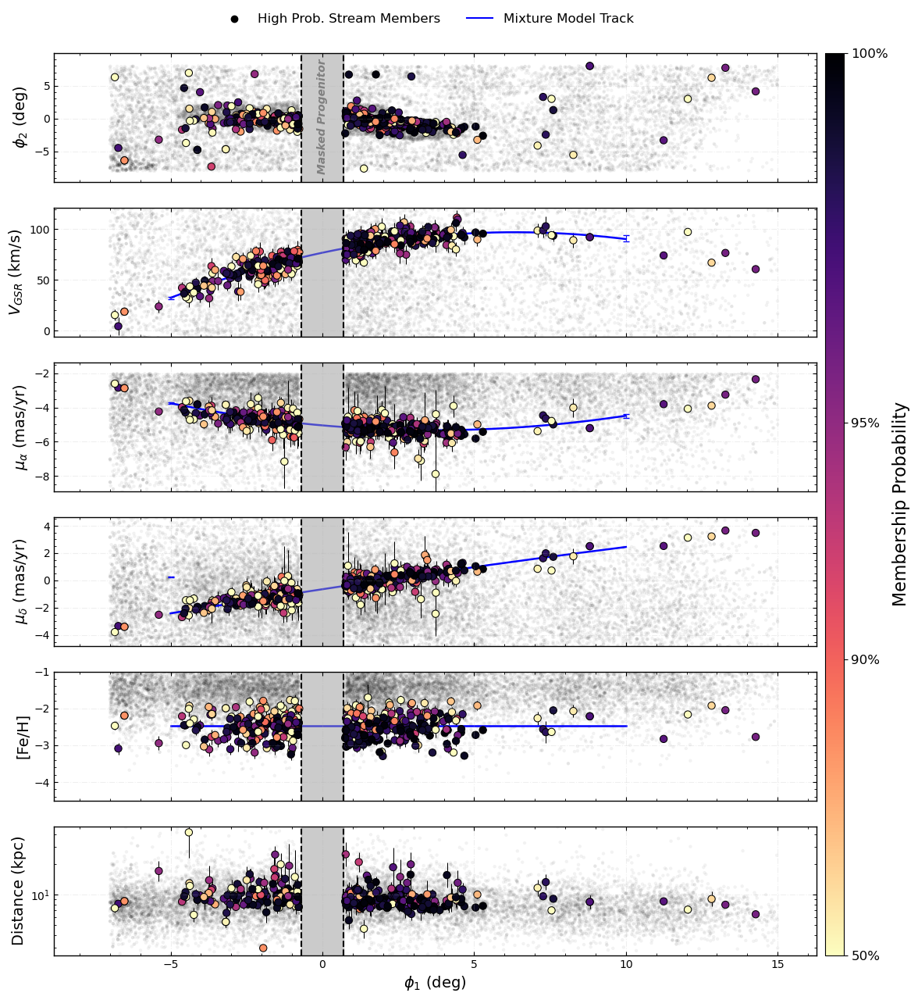

In [403]:
# import galstreams
# mwsts = galstreams.MWStreams(verbose=False, implement_Off=True)
# c19_galstream = mwsts.get("C-19-I24",None)
# gal_phi1 = c19_galstream.track.transform_to(c19.frame).phi1.deg
# gal_phi2 = c19_galstream.track.transform_to(c19.frame).phi2.deg

fig,ax = c19.vis_6_panel(addBackground=True, save_fig=False, show_pm_dispersion=False, show_vgsr_dispersion=False, dist_mod_panel=True, min_prob=0.5, residual=False, show_feh_dispersion=False)

# ax[0].scatter(yuan_desi['phi1'], yuan_desi['phi2'], s=105, facecolor='none', edgecolor='k', marker='D', label=r'Prev. RV Members $\in$ DESI')
# ax[1].scatter(yuan_desi['phi1'], c19.vis6_transform('vgsr', yuan_desi['phi1'], yuan_desi['VGSR']), s=105, facecolor='none', edgecolor='k', marker='D')
# ax[2].scatter(yuan_desi['phi1'], c19.vis6_transform('pmra', yuan_desi['phi1'], yuan_desi['PMRA']), s=105, facecolor='none', edgecolor='k', marker='D')
# ax[3].scatter(yuan_desi['phi1'], c19.vis6_transform('pmdec', yuan_desi['phi1'], yuan_desi['PMDEC']), s=105, facecolor='none', edgecolor='k', marker='D')
# ax[4].scatter(yuan_desi['phi1'], yuan_desi['FEH'], s=105, facecolor='none', edgecolor='k', marker='D')
# ax[5].scatter(yuan_desi['phi1'], 10**((yuan_desi['dist_mod'] + 5.0) / 5.0) / 1000.0, s=105, facecolor='none', edgecolor='k', marker='D')

# ax[0].scatter(bhb_members['phi1'], bhb_members['phi2'], s=80, facecolors='none', edgecolors='b', marker='^', label='BHB Stream Members')
# ax[1].scatter(bhb_members['phi1'], c19.vis6_transform('vgsr', bhb_members['phi1'], bhb_members['VGSR']), s=80, facecolors='none', edgecolors='b', marker='^')
# ax[2].scatter(bhb_members['phi1'], c19.vis6_transform('pmra', bhb_members['phi1'], bhb_members['PMRA']), s=80, facecolors='none', edgecolors='b', marker='^')
# ax[3].scatter(bhb_members['phi1'], c19.vis6_transform('pmdec', bhb_members['phi1'], bhb_members['PMDEC']), s=80, facecolors='none', edgecolors='b', marker='^')
# ax[4].scatter(bhb_members['phi1'], bhb_members['FEH'], s=80, facecolors='none', edgecolors='b', marker='^')
# ax[5].scatter(bhb_members['phi1'], 10**((bhb_members['dist_mod'] + 5.0) / 5.0) / 1000.0, s=80, facecolors='none', edgecolors='b', marker='^')  

# ax[0].scatter(c19.stream_data['phi1'][c19.stream_data['SOURCE_ID'] == 2760807387346283648], c19.stream_data['phi2'][c19.stream_data['SOURCE_ID'] == 2760807387346283648], marker='s', s=205, facecolor='none', edgecolor='k', label='Likely Binary Member')
# ax[1].scatter(c19.stream_data['phi1'][c19.stream_data['SOURCE_ID'] == 2760807387346283648], c19.vis6_transform('vgsr', c19.stream_data['phi1'][c19.stream_data['SOURCE_ID'] == 2760807387346283648], c19.stream_data['VGSR'][c19.stream_data['SOURCE_ID'] == 2760807387346283648]), marker='s', s=205, facecolor='none', edgecolor='k')
# ax[2].scatter(c19.stream_data['phi1'][c19.stream_data['SOURCE_ID'] == 2760807387346283648], c19.vis6_transform('pmra', c19.stream_data['phi1'][c19.stream_data['SOURCE_ID'] == 2760807387346283648], c19.stream_data['PMRA'][c19.stream_data['SOURCE_ID'] == 2760807387346283648]), marker='s', s=205, facecolor='none', edgecolor='k')
# ax[3].scatter(c19.stream_data['phi1'][c19.stream_data['SOURCE_ID'] == 2760807387346283648], c19.vis6_transform('pmdec', c19.stream_data['phi1'][c19.stream_data['SOURCE_ID'] == 2760807387346283648], c19.stream_data['PMDEC'][c19.stream_data['SOURCE_ID'] == 2760807387346283648]), marker='s', s=205, facecolor='none', edgecolor='k')
# ax[4].scatter(c19.stream_data['phi1'][c19.stream_data['SOURCE_ID'] == 2760807387346283648], c19.stream_data['FEH'][c19.stream_data['SOURCE_ID'] == 2760807387346283648], marker='s', s=205, facecolor='none', edgecolor='k')
# ax[5].scatter(c19.stream_data['phi1'][c19.stream_data['SOURCE_ID'] == 2760807387346283648], 10**((c19.stream_data['dist_mod'][c19.stream_data['SOURCE_ID'] == 2760807387346283648] + 5.0) / 5.0) / 1000.0, marker='s', s=205, facecolor='none', edgecolor='k')  

ax[0].scatter([],[], c='k', label='High Prob. Stream Members')

# #adding galstream to phi2 panel
# ax[0].plot(gal_phi1, gal_phi2, c='orange', ls='solid', label=r'galstreams Track', zorder=0)

# ax[0].scatter([],[], c='0.8', s=10, label='Low Prob. Stream Members')

# for a in ax:
#     a.set_xlim(-10, 40)
# # ax[1].set_ylim(-75, 75)
# # ax[2].set_ylim(-0.75, 0.75)
# # ax[3].set_ylim(-0.75, 0.75)
# ax[5].set_ylim(0, 55)

ax[4].set_ylim(-4.5, -1)

ax[0].plot([], [], c='b', ls='solid', label='Mixture Model Track')
# ax[0].plot([], [], c='red', ls='solid', label='MilkyWay2014 Orbit Track (This work)')

for a in ax:
    a.axvline(0.7, ls='--', color='0', lw=1.5)
    a.axvline(-0.7, ls='--', color='0', lw=1.5)
    a.fill_betweenx([-1000, 1000], -0.7, 0.7, color='0.6', alpha=0.5, zorder=0)

# text at 0,0 of first panel, rotated 90 degrees, saying "Masked Progenitor"
ax[0].text(0, -8.5, 'Masked Progenitor', rotation=90, va='bottom', ha='center', fontsize=10, fontstyle='italic', fontweight='bold', c='0.5')   

ax[0].legend(ncol=3, bbox_to_anchor=(0.49, 1.4), loc='upper center', frameon=False, fontsize=12)

# #rasterize and save
# fig_path = './figs/6_panel_ap.pdf'
# for ax_i in ax:
#     for line in ax_i.get_lines():
#         line.set_rasterized(True)
# fig.savefig(fig_path, bbox_inches='tight', dpi=400, transparent=False)


In [305]:
# importlib.reload(ofuncs)
# o_ra, o_dec, o_pmra, o_pmdec, o_vrad, o_dist = ofuncs.orbit_model(results_o.x[0:5], progenitor_ra, fw, bw)
# fig, ax = ofuncs.plot_orbit(o_ra, o_dec, stream_data['RA'], stream_data['DEC'], progenitor_ra)
# shift_ra = ofuncs.zero_360_to_180(c19.desi_data['TARGET_RA'])
# shift_ra_yuan = ofuncs.zero_360_to_180(yuan_2025_rv['ra'])
# shift_ra_bhb = ofuncs.zero_360_to_180(c19.bhb_handler.data[c19.bhb_handler.sel]['TARGET_RA'])

# ax.scatter(np.radians(shift_ra), np.radians(c19.desi_data['TARGET_DEC']), alpha=0.025, s=0.02, zorder=0, c='0.8')


# ax.plot([], [], c='red',label='MW2014 Orbit')
# ax.scatter([],[], c='k', label='This Work', s=20)
# ax.scatter(np.radians(shift_ra_bhb), np.radians(c19.bhb_handler.data[c19.bhb_handler.sel]['TARGET_DEC']), s=10, c='k')
# ax.scatter(np.radians(shift_ra_yuan), np.radians(yuan_2025_rv['dec']), marker='D', facecolor='none', edgecolor='m', s=80, label='Previous RV Mems.', alpha=0.8, zorder=5)
# ax.scatter([],[], c='0.5', label='DESI YR3-Bright Program', s=5)
# ax.legend(loc='upper right', fontsize=11)

# # increase x/y label and tick font sizes to 9 (works if ax is single Axes or array-like)
# axes = ax if hasattr(ax, "__iter__") else [ax]
# for a in np.ravel(axes):
#     xlabel = a.get_xlabel()
#     ylabel = a.get_ylabel()
#     if xlabel:
#         a.set_xlabel(xlabel, fontsize=11)
#     if ylabel:
#         a.set_ylabel(ylabel, fontsize=11)
#     a.tick_params(axis='both', which='major', labelsize=11)
#     a.tick_params(axis='both', which='minor', labelsize=11)

# # for ax in fig.axes:
# #     for artist in ax.collections:  # scatter, contourf, etc.
# #         artist.set_rasterized(True)

# # fig_path = c19.stream_run_directory + '/moll.pdf'
# # fig.savefig(fig_path, bbox_inches='tight', dpi=400, transparent=False)
# # print(f'Saved rasterized PDF: {fig_path}')


In [306]:
phi1_spline_points = c19.spline_points_dict['phi1_spline_points']
pmra_spline_points = c19.nested_dict['meds'][5]
pmdec_spline_points = c19.nested_dict['meds'][6]

In [307]:
spline_phi_arr = np.linspace(-9, 38, 500)

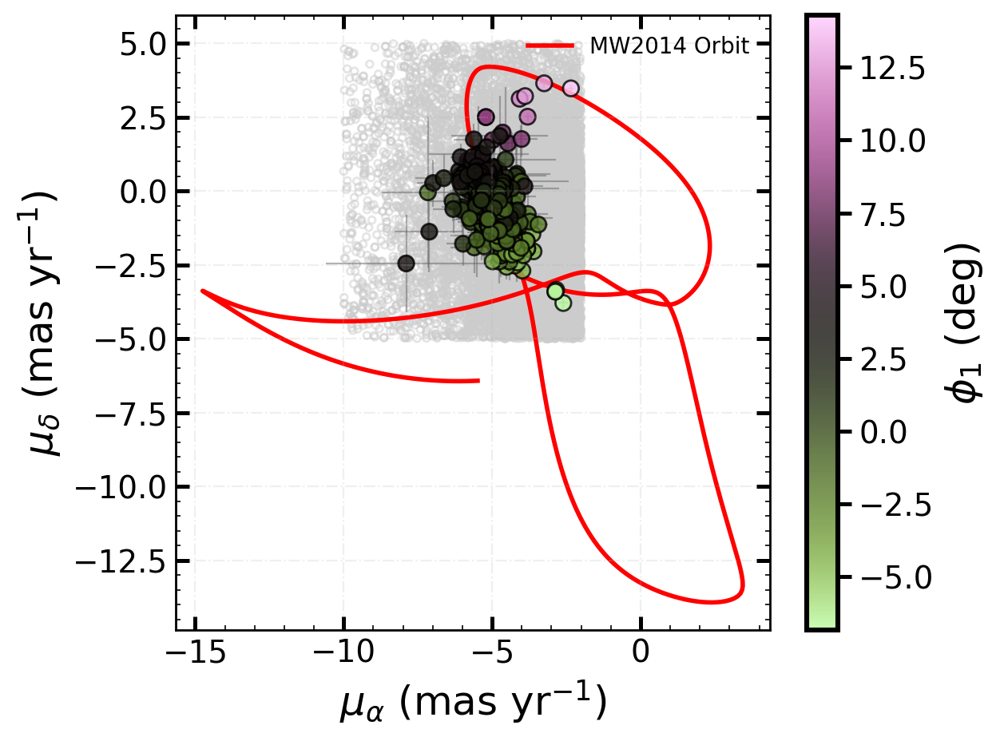

In [134]:
fig, ax = plt.subplots(1, 1, figsize=(6, 5))

ax.scatter(c19.all_memberships['PMRA'], c19.all_memberships['PMDEC'], s=10, edgecolors='0.8', facecolors='none', alpha=0.5, zorder=0)

pmra_vals = np.asarray(c19.stream_data['PMRA'], dtype=float)
pmdec_vals = np.asarray(c19.stream_data['PMDEC'], dtype=float)
phi1_vals = np.asarray(c19.stream_data['phi1'], dtype=float)
pmra_err = np.asarray(c19.stream_data['PMRA_ERROR'], dtype=float)
pmdec_err = np.asarray(c19.stream_data['PMDEC_ERROR'], dtype=float)
valid = np.isfinite(pmra_vals) & np.isfinite(pmdec_vals)
err_valid = valid & np.isfinite(pmra_err) & np.isfinite(pmdec_err)

# Scatter stream members coloured by stream longitude and overlay their proper-motion uncertainties
#plotting spline pms
# ax.plot(stream_funcs.apply_spline(spline_phi_arr, phi1_spline_points, pmra_spline_points),
#         stream_funcs.apply_spline(spline_phi_arr, phi1_spline_points, pmdec_spline_points),
#         c='blue', lw=2, zorder=1)
                                  
ax.plot(o_pmra, o_pmdec, c='red', lw=2, label='MW2014 Orbit', zorder=1)
ax.errorbar(pmra_vals[err_valid], pmdec_vals[err_valid], xerr=pmra_err[err_valid], yerr=pmdec_err[err_valid], fmt='none', ecolor='0.4', alpha=0.5, lw=0.8, capsize=0, zorder=1)
sc = ax.scatter(pmra_vals[valid], pmdec_vals[valid], c=phi1_vals[valid], cmap='vanimo_r', s=50, edgecolors='k', alpha=0.8)
cbar = fig.colorbar(sc, ax=ax)
cbar.set_label(r'$\phi_1$ (deg)')
ax.set_ylabel(r'$\mu_{\delta}$ (mas yr$^{-1}$)')
ax.set_xlabel(r'$\mu_{\alpha}$ (mas yr$^{-1}$)')

# ax.scatter([], [], facecolor='skyblue', edgecolor='k', s=25, label=r'$P_{\in \text{stream}} = 50\%$')
# ax.scatter([], [], facecolor='skyblue', edgecolor='k', s=40, label=r'$P_{\in \text{stream}} = 80\%$')
# ax.scatter([], [], facecolor='skyblue', edgecolor='k', s=50, label=r'$P_{\in \text{stream}} = 100\%$')
ax.legend(frameon=False, loc='upper right', fontsize=10)
plot_form(ax)

In [309]:
mem_path5 = get_mem_path('/Users/nasserm/Documents/vscode/research/streamTut/DESI_loa_c19/runs/C-19-I21_260106_old_photometry_const_uniformprior_DES_ext_5_spline')
stream_data5, stream_run_directory5 = post_mcmc.load_stream_mems(mem_path5)

c19_5 = post_mcmc.StreamMembers(min_dist=min_dist, stream_data=stream_data5, stream_run_directory=stream_run_directory5, fr=fr, withBHB=False, withRRL=False)
pdic = c19_5.return_spline_track(0)
lsig = c19_5.return_spline_track(2)

Loading desi_data...
No desi_data provided, will not use DESI data
Skipping BHB and RRL Data
Done


In [310]:
pdic['phi1_knots']

array([-9.  ,  2.75, 14.5 , 26.25, 38.  ])

In [311]:
c19_5.print_meds()

param             med         em         ep   exp(med)    exp(em)    exp(ep)
--------------------------------------------------------------------------------------
pstream1        0.026     -0.015      0.029
pstream2        0.022     -0.007      0.010
pstream3        0.009     -0.003      0.004
pstream4        0.021     -0.006      0.006
pstream5        0.033     -0.018      0.040
vgsr1          30.120    -10.599     10.150
vgsr2          -9.217     -5.869      4.485
vgsr3         -13.778     -5.878      6.693
vgsr4         -18.639     -2.035      2.085
vgsr5         -29.453     -8.792      8.940
lsigvgsr        0.200     -1.510      0.958      1.584     -1.535     12.797
lsigvgsr2       1.013     -0.215      0.228     10.310     -4.020      7.107
lsigvgsr3       1.077     -0.229      0.236     11.947     -4.894      8.645
lsigvgsr4       0.763     -0.167      0.168      5.800     -1.855      2.740
lsigvgsr5      -0.103     -1.116      0.917      0.789     -0.728      5.729
feh1       

running segment -8 to 0 deg
running segment 0 to 20 deg
running segment 20 to 36 deg
Segment -8 to 0 deg:
  mean RV: -1.11 (+3.11/-3.23)
  σ_v:     7.67 (+3.15/-2.05)
Segment 0 to 20 deg:
  mean RV: -0.34 (+3.72/-3.83)
  σ_v:     10.55 (+3.79/-2.57)
Segment 20 to 36 deg:
  mean RV: -0.13 (+1.39/-1.35)
  σ_v:     4.72 (+1.47/-1.12)
 
OVERALL
  mean RV: -0.26 (+1.30/-1.31)
  σ_v:     6.97 (+1.25/-0.94)
/var/folders/cp/8z3h6wl95fn4l6kxwr2y_0hm0000gn/T/ipykernel_70337/3606865633.py:59: UserWarning: Rasterization of 'Spine' will be ignored
  artist.set_rasterized(True)



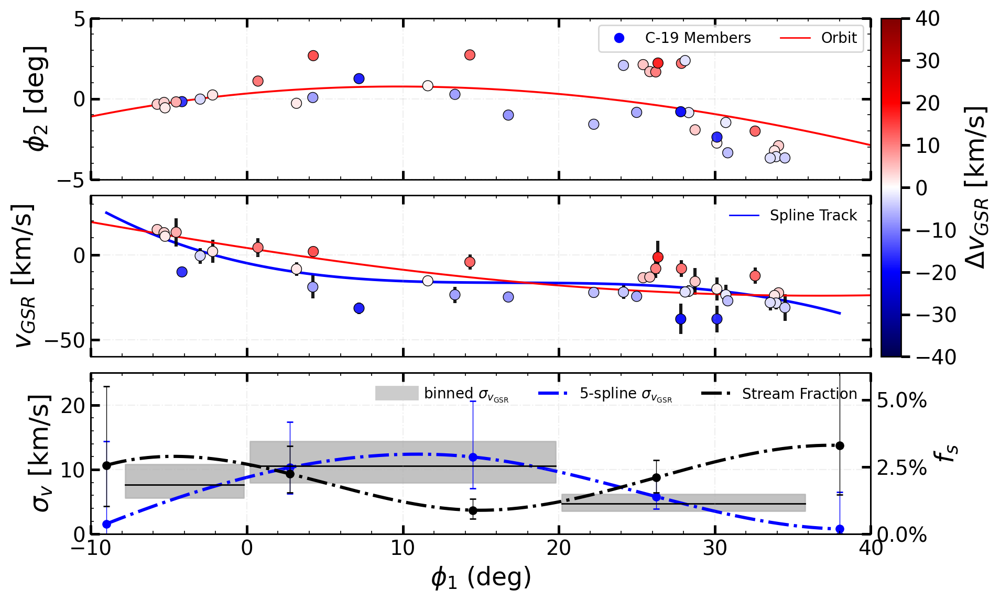

In [312]:
# presentation style
importlib.reload(st)
st.set_presentation(True)
import copy

segments = [(-8, 0), (0,20), (20, 36)]  #segments = [(-8, 0), (0, 24),(24, 30), (30, 36)] # the bounds of the boxes for calculating the velocity dispersion
#c19.segment_vdisp(segments, green_min = 25, green_max=32, useBox=False, externalSpline=True, prob_cutoff=0.9)
fig, ax = c19.segment_vdisp(segments, green_min = -30, green_max=-20, useBox=False, externalSpline=True, prob_cutoff=0.75, show_right_panel=False)
x_arr = np.linspace(-10, 40, 100)
for a in ax:
    a.set_xlim(-10, 38)

# c19_5.add_spline_track(ax[2], med_ind=2, label=r'MCMC $\sigma_v$', color='blue')

ax_twin = ax[2].twinx()
ax_twin.plot(np.linspace(pdic['phi1_knots'].min(), pdic['phi1_knots'].max(), 1000), stream_funcs.apply_spline(np.linspace(pdic['phi1_knots'].min(), pdic['phi1_knots'].max(), 1000), pdic['phi1_knots'], pdic['meds'], k=3), color='k', ls='-.', zorder=0)
#spline points for pdict with upper error ep, lower em
ax_twin.errorbar(pdic['phi1_knots'], pdic['meds'], yerr=[pdic['em'], pdic['ep']], fmt='o', color='k', zorder=0, lw=0.5, markersize=5, capsize=2)
ax_twin.set_ylabel(r'$f_s$')
import matplotlib.ticker as mtick
ax_twin.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))
ax_twin.set_ylim(0,0.06)
ax_twin.set_yticks([0,0.025, 0.05])

ax[0].set_ylim(-5, 5)

ax[2].plot([],[], color='0.8', ls='solid', label=r'binned $\sigma_{v_\text{GSR}}$', lw=10)

# ax[2].axhline(7.9, color='skyblue', ls='solid', lw=2, label='Const. $\sigma_v$', zorder=1)
ax[2].errorbar(lsig['phi1_knots'], lsig['meds'], yerr=[lsig['em'], lsig['ep']], fmt='o', color='blue', zorder=0, lw=0.5, markersize=5, capsize=2)
ax[2].plot(np.linspace(lsig['phi1_knots'].min(), lsig['phi1_knots'].max(), 1000), stream_funcs.apply_spline(np.linspace(lsig['phi1_knots'].min(), lsig['phi1_knots'].max(), 1000), lsig['phi1_knots'], lsig['meds'], k=3), color='blue', ls='-.', zorder=0, label=r'5-spline $\sigma_{v_\text{GSR}}$')

ax[2].plot([],[], color='k', ls='-.', label='Stream Fraction')


linewidth = 1
for axes in fig.axes:
    for spine in axes.spines.values():
        spine.set_linewidth(linewidth)
ax_twin.tick_params(axis='both', which='both', direction='in', top=True, right=True)



legend = ax[2].legend(loc='upper right', fontsize=10, ncol=3, frameon=False)
ax[2].set_xlabel(r'$\phi_1$ (deg)', fontsize=17)
legend.set_zorder(10)

# cbar_ax = fig.add_axes([0.2, 0.2, 0.02, 0.2])
# cbar = fig.colorbar(cm, cax=cbar_ax)
# cbar.set_label(r'$\Delta v_{GSR}$ [km/s]')

fig.set_size_inches(12*0.8, 8*0.8)

for a in ax:
    a.set_xlim(-10, 40)

for axes in fig.axes:
    for artist in axes.get_children():
        artist.set_rasterized(True)
fig_path = './figs/vdisp_pstream.pdf'
plt.savefig(fig_path, bbox_inches='tight', dpi=600)

In [313]:
spur_sel = (c19.stream_data['phi1'] > 20) & (c19.stream_data['phi2'] > 0)
below_sel = (c19.stream_data['phi1'] > 20) & (c19.stream_data['phi2'] < 0) & (c19.stream_data['phi1'] < 30)

c19.stream_data['VGSR'][spur_sel].mean(), c19.stream_data['VGSR'][below_sel].mean()

(-12.547666174512127, -23.379619441497738)

In [473]:
import numpy as np

# orbit track in stream coords
o_phi1, o_phi2 = stream_funcs.ra_dec_to_phi1_phi2(
    fr,
    o_ra * u.deg,
    o_dec * u.deg
)

# strip units (np.interp wants plain floats)
o_phi1v = np.asarray(getattr(o_phi1, "value", o_phi1), dtype=float)
o_phi2v = np.asarray(getattr(o_phi2, "value", o_phi2), dtype=float)

# sort orbit by phi1
srt = np.argsort(o_phi1v)
o_phi1v = o_phi1v[srt]
o_phi2v = o_phi2v[srt]

# stream stars
phi1s = np.asarray(c19.stream_data["phi1"], dtype=float)
phi2s = np.asarray(c19.stream_data["phi2"], dtype=float)

# only use stars with phi1 < 20 AND within orbit phi1 range
phi1_mask = (phi1s < 20)
in_orbit_domain = (phi1s >= o_phi1v.min()) & (phi1s <= o_phi1v.max())
use = phi1_mask & in_orbit_domain

orbit_phi2_at_star = np.interp(phi1s[use], o_phi1v, o_phi2v)

# padding of 0.25 degrees
padding = 0.25

above_mask = np.zeros_like(phi1s, dtype=bool)
below_mask = np.zeros_like(phi1s, dtype=bool)
close_mask = np.zeros_like(phi1s, dtype=bool)

above_mask[use] = phi2s[use] > (orbit_phi2_at_star + padding)
below_mask[use] = phi2s[use] < (orbit_phi2_at_star - padding)
close_mask[use] = np.abs(phi2s[use] - orbit_phi2_at_star) <= padding

print("phi1<20:", phi1_mask.sum())
print("phi1<20 and in orbit domain:", use.sum())
print("  above (>0.25° from orbit):", above_mask.sum())
print("  below (<-0.25° from orbit):", below_mask.sum())
print("  close (within ±0.25° of orbit):", close_mask.sum())

phi1<20: 18
phi1<20 and in orbit domain: 18
  above (>0.25° from orbit): 5
  below (<-0.25° from orbit): 6
  close (within ±0.25° of orbit): 7


In [487]:
# print mean vgsr of above and below
print("Mean VGSR above orbit:", c19.stream_data["VGSR"][above_mask].mean())
print("Mean VGSR below orbit:", c19.stream_data["VGSR"][below_mask].mean())

Mean VGSR above orbit: -3.5076552623490898
Mean VGSR below orbit: -12.192422964986411


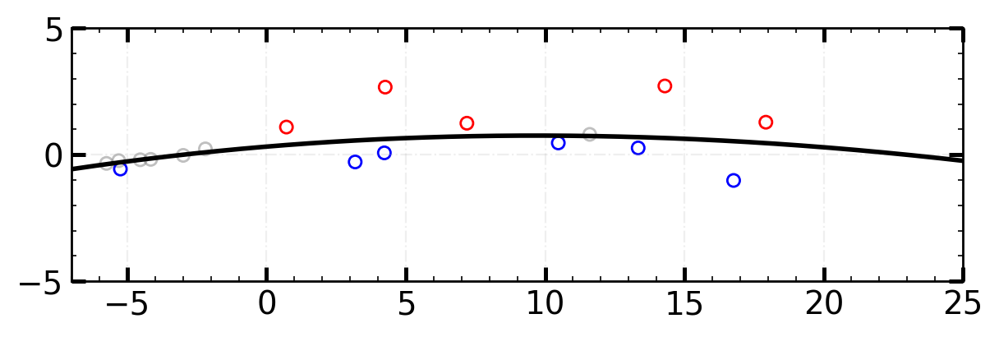

In [488]:
# plot phi1 vs phi2, colour by above or below orbit
fig, ax = plt.subplots(1, 1, figsize=(7, 2))
ax.scatter(c19.stream_data["phi1"][use & close_mask], c19.stream_data["phi2"][use & close_mask], s=30, edgecolors='0.5', facecolors='none', alpha=0.5, label='Close to Orbit')
ax.scatter(c19.stream_data["phi1"][use & above_mask], c19.stream_data["phi2"][use & above_mask], s=30, edgecolors='r', facecolors='none', label='Above Orbit')
ax.scatter(c19.stream_data["phi1"][use & below_mask], c19.stream_data["phi2"][use & below_mask], s=30, edgecolors='b', facecolors='none', label='Below Orbit')
ax.plot(o_phi1v, o_phi2v, c='k', lw=2, label='Orbit Track')
ax.set_xlim(-7, 25)
ax.set_ylim(-5, 5)
stream_funcs.plot_form(ax)

In [314]:
c19.stream_data[c19.stream_data['SOURCE_ID'] == 2760807387346283648]['stream_prob']

0.9761546459857099


In [315]:
len(c19.stream_data[(c19.stream_data['phi1'] < 0) & (c19.stream_data['phi1'] > -8)]), len(c19.stream_data[(c19.stream_data['phi1'] >= 0) & (c19.stream_data['phi1'] < 20)]), len(c19.stream_data[(c19.stream_data['phi1'] >= 20) & (c19.stream_data['phi1'] < 36)])

(7, 11, 23)

running segment -8 to 0 deg
running segment 0 to 20 deg
running segment 20 to 36 deg
Segment -8 to 0 deg:
  mean RV: -1.08 (+3.18/-3.33)
  σ_v:     7.72 (+3.38/-2.14)
Segment 0 to 20 deg:
  mean RV: 0.90 (+3.97/-4.02)
  σ_v:     10.68 (+4.31/-2.66)
Segment 20 to 36 deg:
  mean RV: -0.08 (+1.35/-1.36)
  σ_v:     4.80 (+1.48/-1.20)
 
OVERALL
  mean RV: 0.04 (+1.35/-1.32)
  σ_v:     6.84 (+1.16/-0.97)


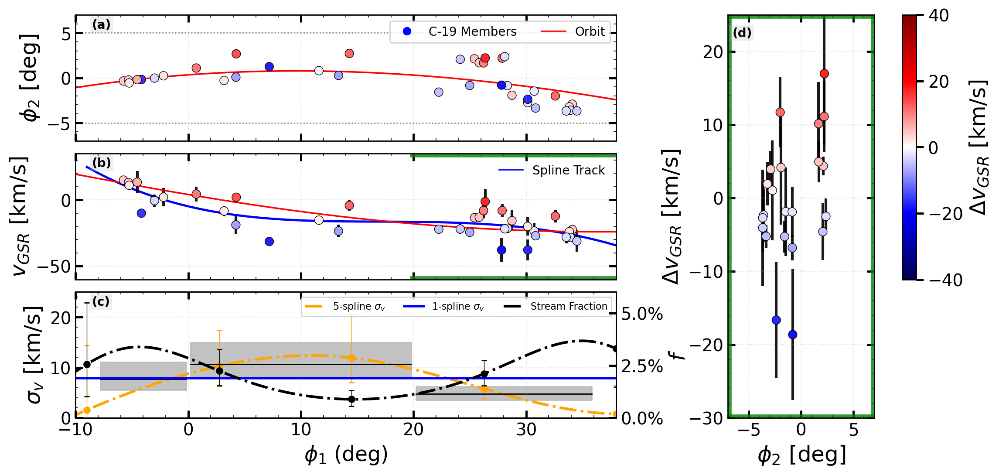

In [316]:
# presentation style
st.set_presentation(True)
import copy
c20 = copy.copy(c19)

segments = [(-8, 0), (0, 20),(20, 36)] # the bounds of the boxes for calculating the velocity dispersion
#c19.segment_vdisp(segments, green_min = 25, green_max=32, useBox=False, externalSpline=True, prob_cutoff=0.9)
c20.stream_data = c19.stream_data[c19.stream_data['SOURCE_ID'] != 2760807387346283648]
fig, ax = c20.segment_vdisp(segments, green_min = 20, green_max=38, useBox=False, externalSpline=True, prob_cutoff=0.75)
x_arr = np.linspace(-10, 40, 100)
for a in ax:
    a.set_xlim(-10, 38)

# c19_5.add_spline_track(ax[2], med_ind=2, label=r'MCMC $\sigma_v$', color='blue')

ax_twin = ax[2].twinx()
ax_twin.plot(pdic['phi1'], pdic['spline'], color='k', ls='-.', zorder=0)
#spline points for pdict with upper error ep, lower em
ax_twin.errorbar(pdic['phi1_knots'], pdic['meds'], yerr=[pdic['em'], pdic['ep']], fmt='o', color='k', zorder=0, lw=0.5, markersize=5, capsize=2)
ax_twin.set_ylabel(r'$f$')
import matplotlib.ticker as mtick
ax_twin.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))
ax_twin.set_ylim(0,0.06)
ax_twin.set_yticks([0,0.025, 0.05])


ax[2].errorbar(lsig['phi1_knots'], lsig['meds'], yerr=[lsig['em'], lsig['ep']], fmt='o', color='orange', zorder=0, lw=0.5, markersize=5, capsize=2)
ax[2].plot(lsig['phi1'], stream_funcs.apply_spline(lsig['phi1'], lsig['phi1_knots'], lsig['meds'], k=3), color='orange', ls='-.', zorder=0, label=r'5-spline $\sigma_v$')
ax[2].axhline(7.9, color='blue', ls='solid', lw=2, label='1-spline $\sigma_v$', zorder=1)
ax[2].plot([],[], color='k', ls='-.', label='Stream Fraction')


linewidth = 1
for axes in fig.axes:
    for spine in axes.spines.values():
        spine.set_linewidth(linewidth)
ax_twin.tick_params(axis='both', which='both', direction='in', top=True, right=True)



legend = ax[2].legend(loc='upper right', fontsize=8, ncol=3)
ax[2].set_xlabel(r'$\phi_1$ (deg)', fontsize=17)
legend.set_zorder(10)

for a in ax:
    a.set_xlim(None, 38)

# for axes in fig.axes:
#     for artist in axes.get_children():
#         artist.set_rasterized(True)
# fig_path = 'figures_draft/vdisp_pstream.pdf'
# plt.savefig(fig_path, bbox_inches='tight', dpi=600)

/Users/nasserm/Documents/vscode/research/streamTut/DESI_loa_c19/post_mcmc.py:2476: UserWarning: Rasterization of 'Spine' will be ignored
  artist.set_rasterized(True)



(<Figure size 3000x2500 with 6 Axes>,
 array([<Axes: ylabel='$\\phi_2$ (deg)'>,
        <Axes: ylabel='$V_{GSR}$ (km/s)'>,
        <Axes: ylabel='$\\mu_{\\alpha}$ (mas/yr)'>,
        <Axes: ylabel='$\\mu_{\\delta}$ (mas/yr)'>,
        <Axes: xlabel='$\\phi_1$ (deg)', ylabel='[Fe/H]'>], dtype=object))

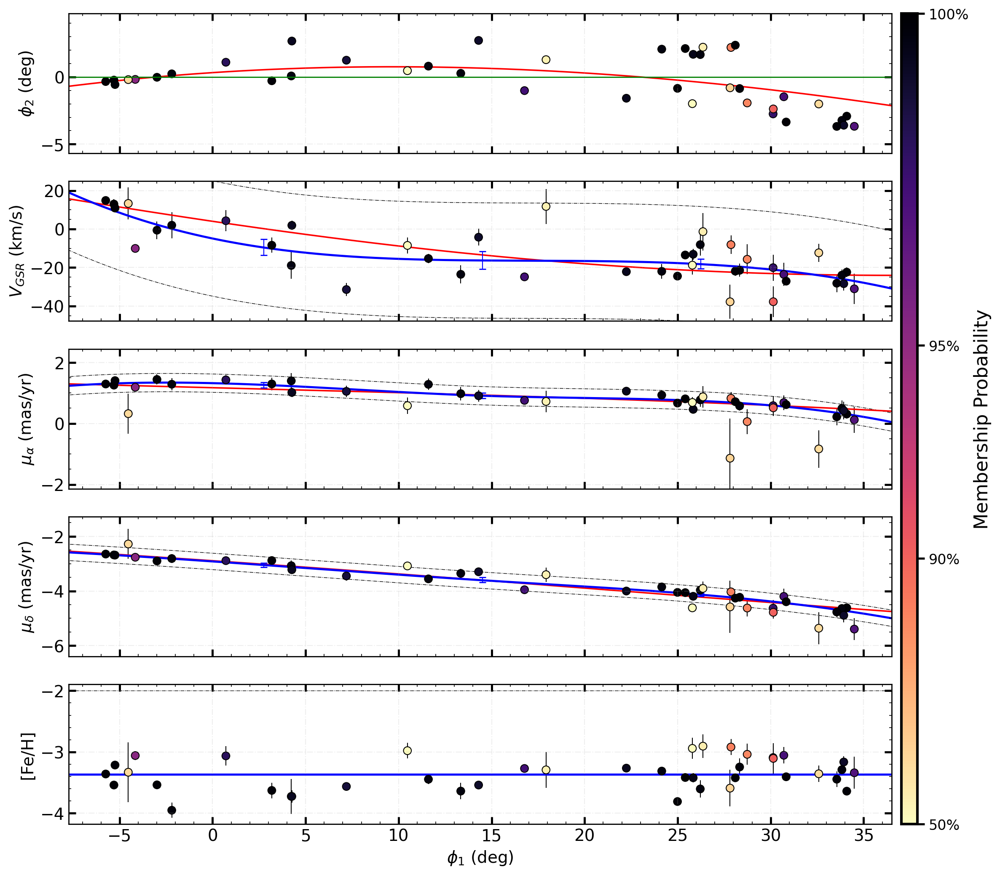

In [317]:
pad = np.array([30, -2, 0.3, 0.3, 10]) # vgsr, feh, pmra, pmdec, phi2
c19.vis_6_panel(addBackground=False, save_fig=False, pad=pad)

## vdisp box_cut

running segment -10 to 8 deg
running segment 8 to 23 deg
running segment 23 to 36 deg
Segment -10 to 8 deg:
  mean RV: -1.28 (+3.37/-3.38)
  σ_v:     12.16 (+2.93/-2.18)
Segment 8 to 23 deg:
  mean RV: -0.05 (+4.00/-3.82)
  σ_v:     10.75 (+4.45/-2.88)
Segment 23 to 36 deg:
  mean RV: 0.25 (+1.80/-1.72)
  σ_v:     7.13 (+1.71/-1.31)
 
OVERALL
  mean RV: -0.18 (+1.53/-1.56)
  σ_v:     9.60 (+1.31/-1.13)


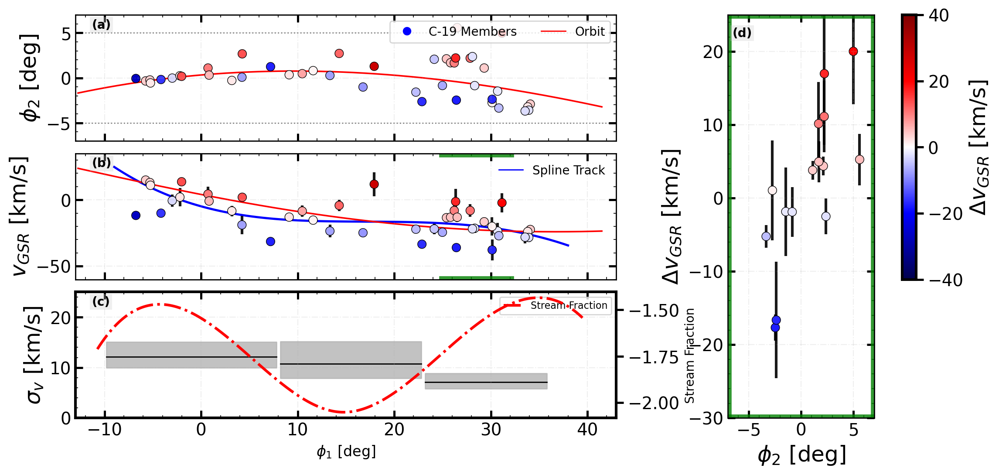

In [318]:
segments = [(-10, 8), (8, 23),(23, 36)] # the bounds of the boxes for calculating the velocity dispersion
#c19.segment_vdisp(segments, green_min = 25, green_max=32, useBox=False, externalSpline=True, prob_cutoff=0.9)
fig, ax = c19.segment_vdisp(segments, green_min = 25, green_max=32, useBox=True, externalSpline=True, prob_cutoff=0.5)
x_arr = np.linspace(-10, 40, 100)

# c19_5.add_spline_track(ax[2], med_ind=2, label=r'MCMC $\sigma_v$', color='blue')

ax_twin = ax[2].twinx()
ax_twin.plot(pdic['phi1'], np.log10(pdic['spline']), color='red', ls='-.', zorder=0)
ax_twin.set_ylabel(r'Stream Fraction', fontsize=10)

ax[2].plot([],[], color='r', ls='-.', label='Stream Fraction')
ax[2].legend(loc='upper right', fontsize=8)

# for ax in plt.gcf().get_axes():
#     for artist in ax.get_children():
#         artist.set_rasterized(True)
# fig_path = 'figures_draft/postmcmc_vdispbox.png'
# plt.savefig(fig_path, bbox_inches='tight', dpi=600)

# Gaia + DeCALS

Duplicates: 67717
Duplicates remaining: 7510
Duplicates remaining: 0
Converting to phi1, phi2...
showing GaiaDeCALS data in stream frame...
Applied cuts: [ 0.8  0.8 20. ] for panels: ['pmra', 'pmdec', 'phi2'], with a parallax cut
0
No orbit has been run yet, please run do_orbit first


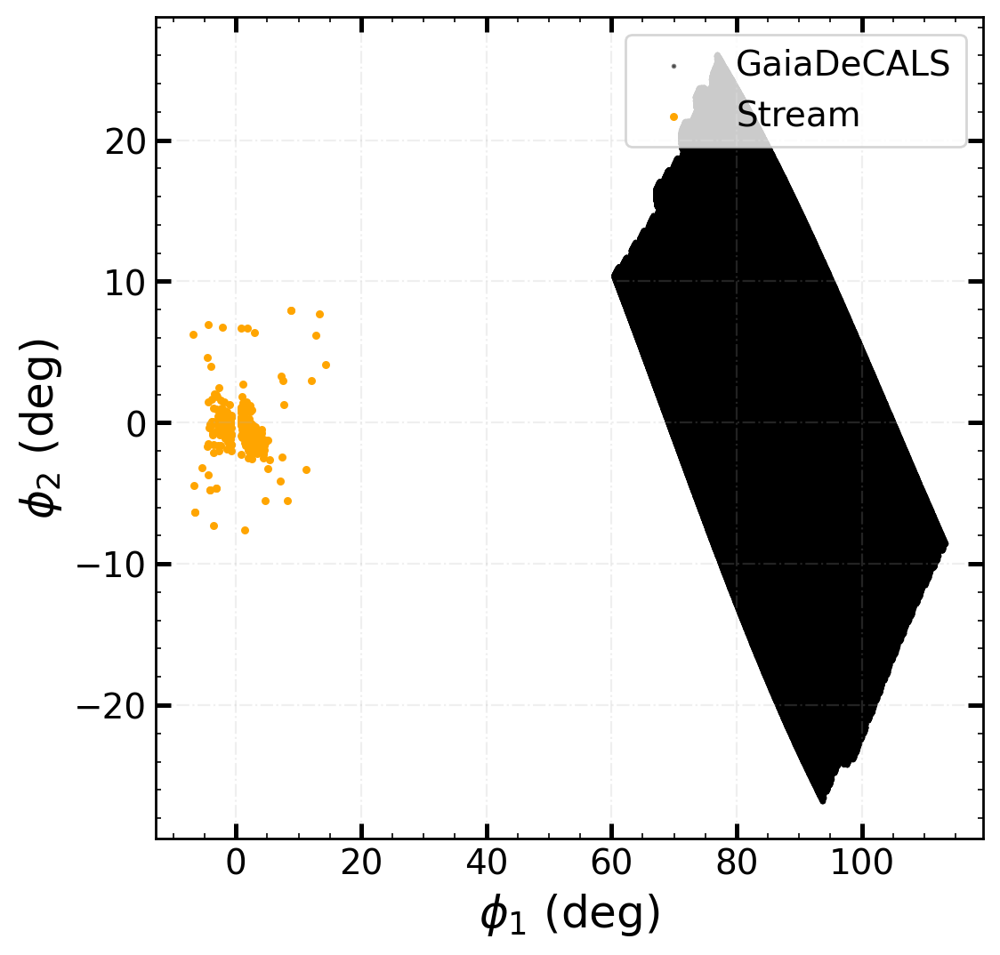

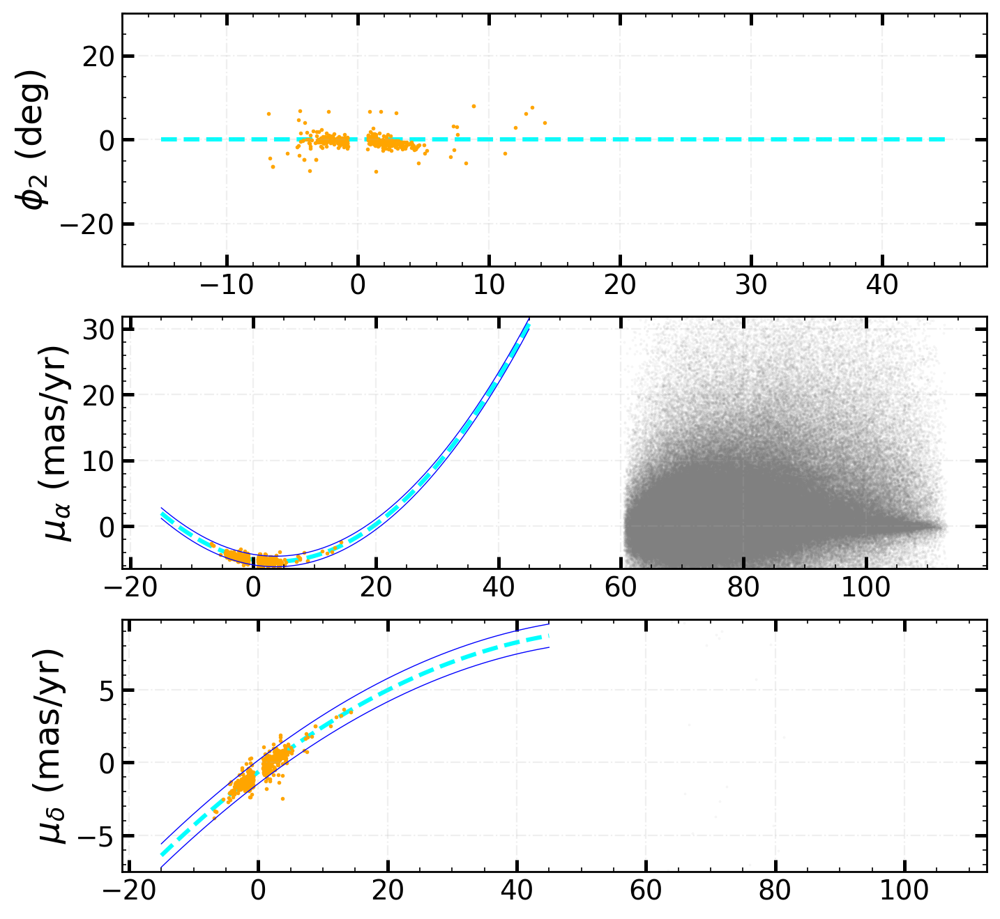

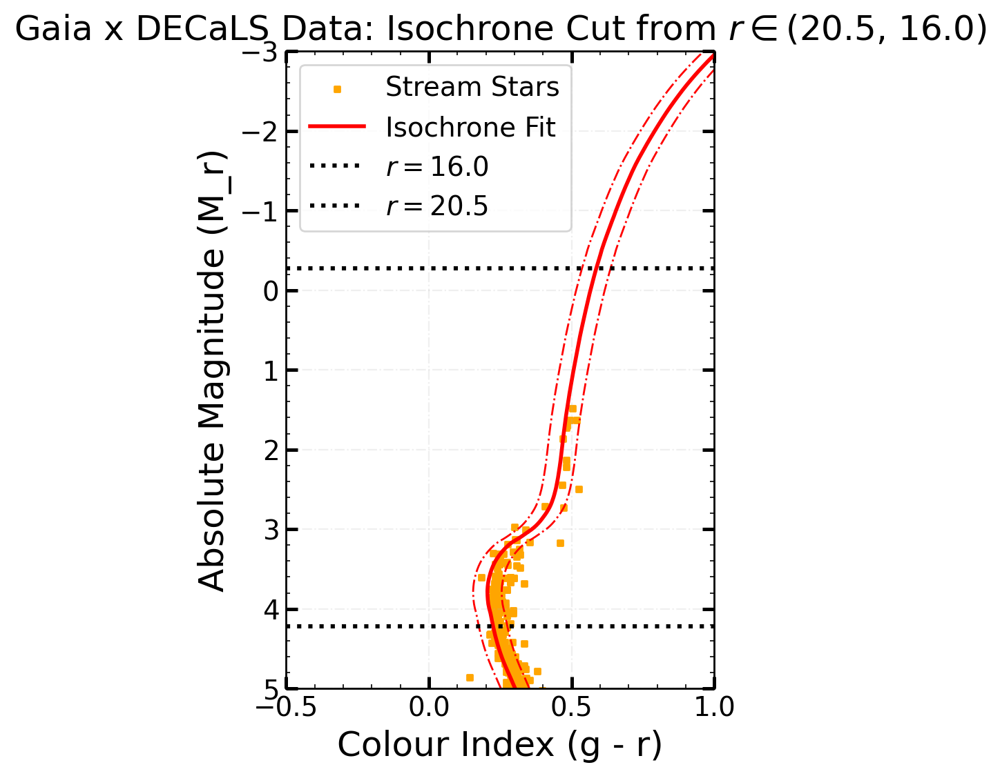

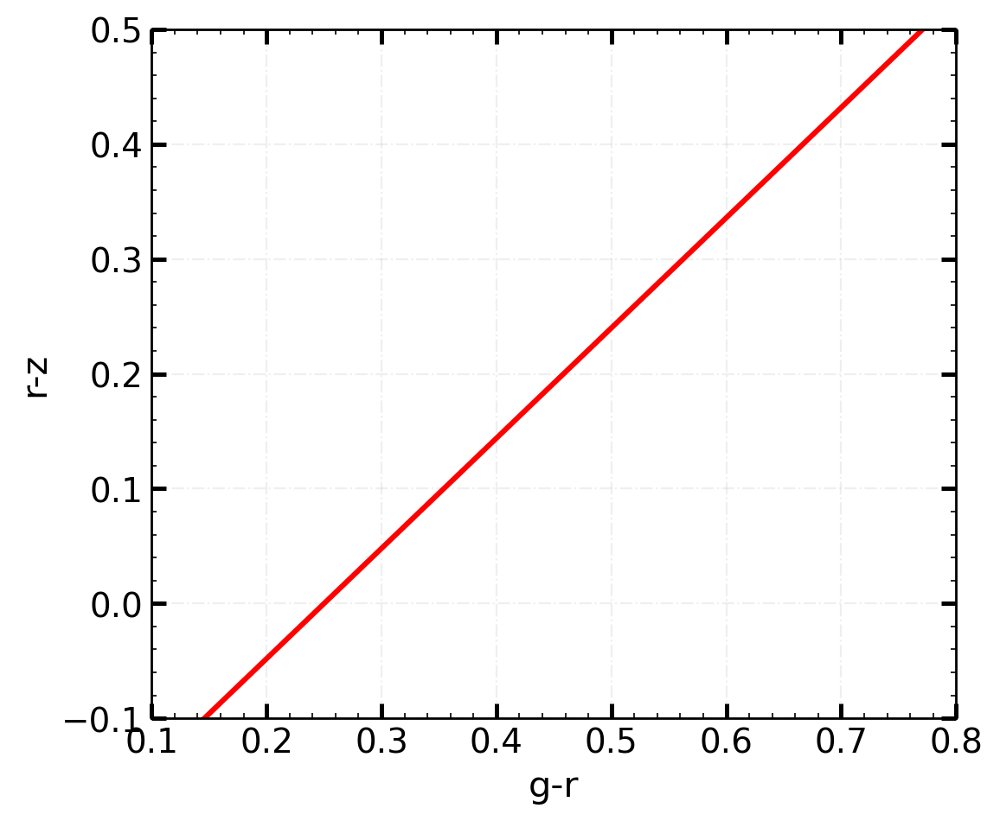

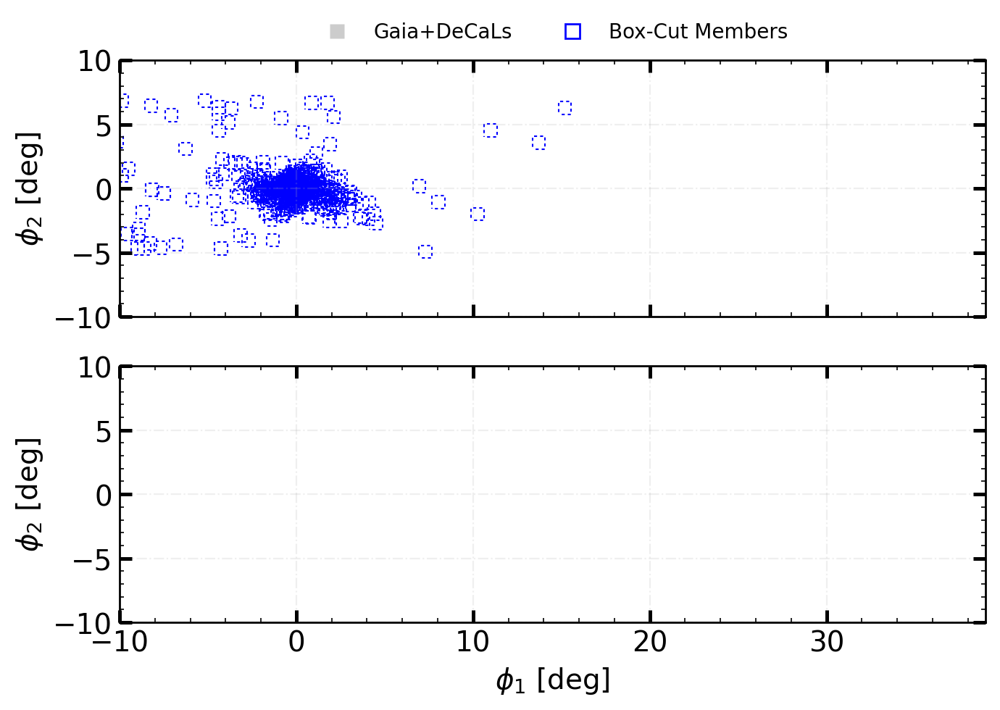

In [135]:
st.set_presentation(True)
c19.GaiaDECALS_cut(GaiaDeCALS_path='/Users/nasserm/Documents/vscode/research/streamTut/DESI_loa_c19/data/C-19_gaia_x_decals_nasser_phi2_10.fits', addOrbit=True, useBox=True, pad=np.array([0.8,0.8, 20]))

In [320]:
o_phi1, o_phi2 = ofuncs.ra_dec_to_phi1_phi2(c19.frame, o_ra*u.deg, o_dec*u.deg)

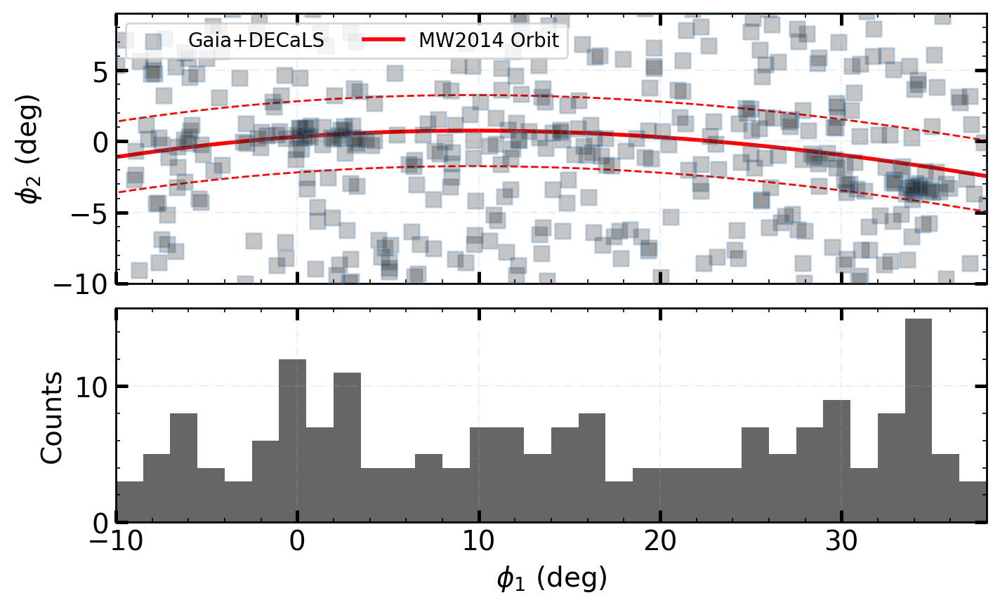

In [321]:
st.set_presentation(True)

fig, ax = plt.subplots(2, 1, figsize=(8, 5), sharex=True)


# 2D histogram instead of scatter
# choose bin width in deg
# bw = 2

# phi1 = c19.gaia_decals['phi1'].to_numpy()
# phi2 = c19.gaia_decals['phi2'].to_numpy()

# xedges = np.arange(phi1.min(), phi1.max() + bw, bw)
# yedges = np.arange(phi2.min(), phi2.max() + bw, bw)

# from matplotlib.colors import PowerNorm

# h = ax[0].hist2d(
#     phi1, phi2,
#     bins=[xedges, yedges],
#     cmap='gray_r',
#     norm=PowerNorm(gamma=1.1)  # <1 boosts low counts
# )
# h[3].cmap.set_under('0.9'); h[3].set_clim(vmin=1)
# # colorbar
# cb = fig.colorbar(h[3], ax=ax[0])
# cb.set_label('Count')

# ax[0].scatter(c19.ms_handler.data[c19.ms_handler.set_variants['phi2']]['phi1'], c19.ms_handler.data[c19.ms_handler.set_variants['phi2']]['phi2'], s=60, edgecolors='none', facecolors='0.2', alpha=0.5, label='MS+RGB', zorder=5)
# ax[0].scatter(c19.bhb_handler.data[c19.bhb_handler.sel]['phi1'], c19.bhb_handler.data[c19.bhb_handler.sel]['phi2'], s=60, edgecolors='b', facecolors='blue', marker='^', label='BHB', alpha=0.7, zorder=5)
# ax[0].plot(o_phi1, o_phi2, color='red', lw=2, zorder=0)
# ax[0].set_xlim(-10, 38)
# ax[0].set_ylim(-16, 16)
# ax[0].set_aspect(0.35)
# ax[0].axhline(-7, ls='dotted', c='k', label=r'Box-cut $\phi_2$ range', lw=1, zorder=0)
# ax[0].axhline(7, ls='dotted', c='k', lw=1, zorder=0)
# ax[0].legend(frameon=True, fontsize=10, ncol=4, loc='upper right')


ax[0].scatter(c19.gaia_decals['phi1'], c19.gaia_decals['phi2'], s=60, edgecolors='steelblue', facecolors='0.1', alpha=0.25, marker='s', label='Gaia+DECaLS', zorder=5)
ax[0].set_ylabel(r'$\phi_2$ (deg)', fontsize=14)
ax[0].set_xlim(-9, 38)
ax[0].set_ylim(-10, 9)
# ax[1].scatter(c19.ms_handler.data[c19.ms_handler.sel]['phi1'], c19.ms_handler.data[c19.ms_handler.sel]['phi2'], s=60, edgecolors='blue', ls='dashed', facecolors='none', marker='s', label='MS+RGB', alpha=0.7)
# ax[1].scatter(c19.bhb_handler.data[c19.bhb_handler.sel]['phi1'], c19.bhb_handler.data[c19.bhb_handler.sel]['phi2'], s=60, edgecolors='b', facecolors='blue', marker='^', label='BHB', alpha=0.7)
ax[0].plot(o_phi1, o_phi2, color='red', lw=2, label='MW2014 Orbit', zorder=0)
ax[0].plot(o_phi1, o_phi2+2.5, ls='--', color='red', lw=1, zorder=0)
ax[0].plot(o_phi1, o_phi2-2.5, ls='--', color='red', lw=1, zorder=0)
ax[0].legend(frameon=True, fontsize=10, ncol=4, loc='upper left')


# ax[1].scatter(c19.ms_handler.data[c19.ms_handler.sel]['phi1'], c19.ms_handler.data[c19.ms_handler.sel]['phi2'], s=60, edgecolors='none', facecolors='0.4', alpha=0.8)
# ax[1].scatter(c19.bhb_handler.data[c19.bhb_handler.sel]['phi1'], c19.bhb_handler.data[c19.bhb_handler.sel]['phi2'], s=60, edgecolors='b', facecolors='blue', marker='^')
# ax[1].set_xlim(-10, 38)
# ax[1].set_ylim(-9, 9)

import matplotlib.ticker as mtick
# create bins of count of stars within +- 3 degrees of orbit, for each 1 deg bin in phi1
# bin width in phi1
bw_phi1 = 1.5
# bin half-width in phi2
hw_phi2 = 2.5
phi1_bins = np.arange(-10, 39, bw_phi1)
counts = []
bin_centers = 0.5 * (phi1_bins[1:] + phi1_bins[:-1])
# interpolate phi2 track for given phi1 using scipy
from scipy.interpolate import interp1d
phi2_track_func = interp1d(o_phi1, o_phi2, kind='linear', bounds_error=False, fill_value='extrapolate')


for i, phi1_center in enumerate(bin_centers):
    phi2_center = phi2_track_func(phi1_center)
    in_bin = (
        (c19.gaia_decals['phi1'] >= phi1_bins[i]) &
        (c19.gaia_decals['phi1'] <  phi1_bins[i+1]) &
        (c19.gaia_decals['phi2'] >= phi2_center - hw_phi2) &
        (c19.gaia_decals['phi2'] <= phi2_center + hw_phi2)
    )
    counts.append(np.sum(in_bin))

counts = np.array(counts)
# dont need to normalize
ax[1].bar(phi1_bins[:-1] + bw_phi1/2, counts, width=bw_phi1, color='0.4', edgecolor='none', align='center', zorder=0)
ax[1].set_xlim(-10, 38)
ax[1].set_ylabel('Counts', fontsize=14)


# ax[2].plot(pdic['phi1'], pdic['spline'], color='k', ls='-.', zorder=0)
# ax[2].errorbar(pdic['phi1_knots'], pdic['meds'], yerr=[pdic['em'], pdic['ep']], fmt='o', color='k', zorder=0, lw=0.5, markersize=5, capsize=2)
# ax[2].set_ylabel(r'$\mathcal{f}$')
# ax[2].yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))
# ax[2].set_ylim(0,0.06)
# ax[2].set_yticks([0,0.025, 0.05])

ax[1].set_aspect(0.75)

# reduce hspace between ax[2] and ax[1]
plt.subplots_adjust(hspace=0)

shift = -0.03 # adjust
pos = ax[0].get_position()
ax[0].set_position([pos.x0, pos.y0 + shift, pos.width, pos.height])

shift = 0.025 # adjust
pos = ax[1].get_position()
ax[1].set_position([pos.x0, pos.y0 - shift, pos.width, pos.height])

ax[-1].set_xlabel(r'$\phi_1$ (deg)', fontsize=14)

for a in ax:
    plot_form(a)

# rasterize and save
fig_path = './figs/gaiadecals_counts.pdf'
for ax_i in ax:
    for artist in ax_i.get_children():
        artist.set_rasterized(True)
fig.savefig(fig_path, bbox_inches='tight', dpi=400, transparent=False)


In [322]:
phi2_track_at_center

NameError: name 'phi2_track_at_center' is not defined

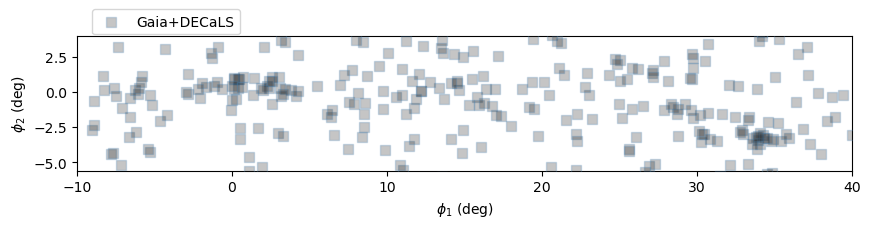

In [ ]:
st.set_presentation(False)

fig, ax = plt.subplots(1, 1, figsize=(10, 1.75))




ax.scatter(c19.gaia_decals['phi1'], c19.gaia_decals['phi2'], s=60, edgecolors='steelblue', facecolors='0.1', alpha=0.25, marker='s', label='Gaia+DECaLS', zorder=5)
ax.set_ylabel(r'$\phi_2$ (deg)')
ax.set_xlim(-10, 40)
ax.set_ylim(-5.6, 4)
ax.set_xlabel(r'$\phi_1$ (deg)')
# ax[1].scatter(c19.ms_handler.data[c19.ms_handler.sel]['phi1'], c19.ms_handler.data[c19.ms_handler.sel]['phi2'], s=60, edgecolors='blue', ls='dashed', facecolors='none', marker='s', label='MS+RGB', alpha=0.7)
# ax[1].scatter(c19.bhb_handler.data[c19.bhb_handler.sel]['phi1'], c19.bhb_handler.data[c19.bhb_handler.sel]['phi2'], s=60, edgecolors='b', facecolors='blue', marker='^', label='BHB', alpha=0.7)
# ax.plot(o_phi1, o_phi2, color='red', lw=2, label='MW2014 Orbit', zorder=0)
ax.legend(frameon=True, fontsize=10, ncol=4, loc='upper left', bbox_to_anchor=(0.01, 1.25))


# ax[1].scatter(c19.ms_handler.data[c19.ms_handler.sel]['phi1'], c19.ms_handler.data[c19.ms_handler.sel]['phi2'], s=60, edgecolors='none', facecolors='0.4', alpha=0.8)
# ax[1].scatter(c19.bhb_handler.data[c19.bhb_handler.sel]['phi1'], c19.bhb_handler.data[c19.bhb_handler.sel]['phi2'], s=60, edgecolors='b', facecolors='blue', marker='^')
# ax[1].set_xlim(-10, 38)
# ax[1].set_ylim(-9, 9)


# Visualize Isochrone

In [ ]:
c19.all_memberships

,TARGET_RA,TARGET_DEC,FEH,FEH_ERR,LOGG,TARGETID,VRAD,PRIMARY,TEFF,VRAD_ERR,...,FLUX_Z,FLUX_R,FLUX_G,EBV,dist_mod_err_right,dist_mod_right,VGSR,phi1,phi2,stream_prob
0,353.563225,0.289731,-3.311411,0.068510,1.700364,2305843028914349784,-149.726296,True,4276.147562,3.885121,...,143.613129,113.870483,67.203354,0.030519,0.665169,11.934290,-21.953286,24.145494,2.068198,9.975175e-01
1,351.888995,0.548182,-2.022950,0.053072,2.393685,2305843028922729488,-244.430660,True,5550.899072,2.191906,...,165.296463,137.310654,89.696716,0.037227,0.165108,17.132675,-112.730142,24.073960,0.375692,4.687979e-93
2,348.795160,-1.481197,-2.380920,0.016677,2.765168,2305843028872396866,-166.732709,True,4866.118074,1.786515,...,402.544006,303.573029,159.878265,0.038204,0.842849,11.771302,-36.008499,26.434445,-2.473814,5.001131e-05
3,351.850009,-1.199560,-2.608858,0.096326,2.934813,2305843028910145917,-75.502806,True,5602.663310,4.362662,...,130.441788,108.670761,72.499504,0.046478,0.691117,15.412014,50.732694,25.815364,0.530055,8.849921e-127
4,352.721040,-1.052964,-2.443782,0.047226,2.620196,2305843028910149870,-270.026184,True,5245.636752,1.715712,...,530.216553,391.342621,224.821808,0.038140,0.238153,15.816554,-144.927802,25.573617,1.379448,5.479687e-318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1856,357.423250,29.278464,-2.725233,0.063733,4.325198,39628467544789375,-198.862255,True,6436.300225,2.436981,...,32.566216,30.313738,22.190441,0.060432,0.086744,14.930490,-6.427115,-5.095822,2.072139,1.581243e-77
1857,357.288623,28.819691,-2.143288,0.040431,4.500160,39628456975140790,-257.656655,True,6300.354705,1.911840,...,35.572708,31.446692,21.878313,0.055703,0.254154,14.248062,-65.782944,-4.624463,2.022870,3.078579e-31
1858,357.336744,30.061407,-2.203631,0.035676,4.603986,39628483306983255,-178.962468,True,6301.646951,1.639152,...,63.686264,56.182598,40.805840,0.072907,0.128276,13.223687,14.964728,-5.859674,1.882736,1.883180e-173
1859,354.917728,28.266527,-2.477402,0.075419,3.569801,39628446321607073,-98.460807,True,5955.296663,1.874113,...,53.039078,37.516346,20.471590,0.220825,0.223863,15.241689,96.587092,-3.793682,0.034490,4.258002e-73


# Memprob Histogram

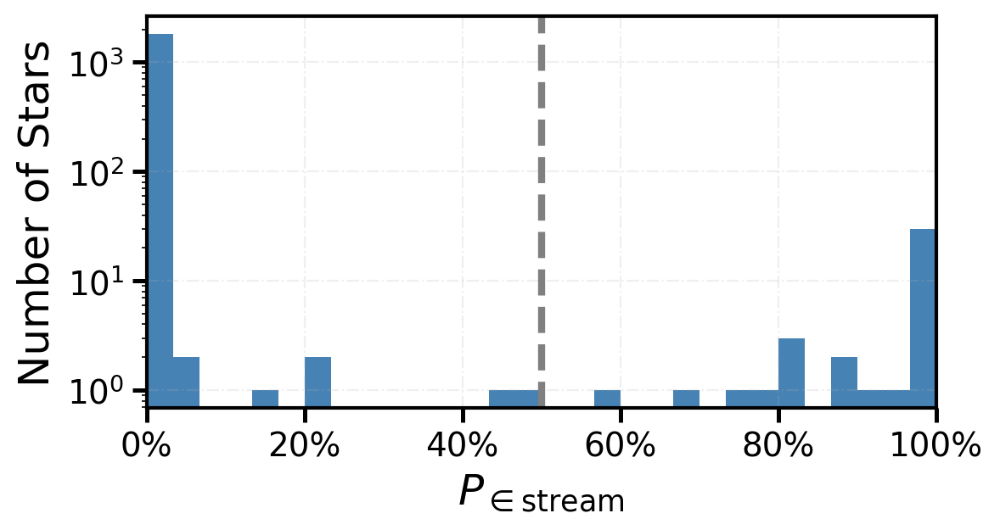

In [ ]:

fig, ax = plt.subplots(1, 1, figsize=(5*1.2, 2*1.5))

ax.hist(c19.all_memberships['stream_prob'], bins=30, range=(0,1), color='steelblue', edgecolor='none')
# log y scale
ax.set_yscale('log')
plot_form(ax)

#turn off top and right ticks
ax.tick_params(axis='both', which='both', direction='out', top=False, right=False)
#turn off minor ticks for x axis
ax.tick_params(axis='x', which='minor', bottom=False)
ax.set_xlabel(r'$P_{\in \text{stream}}$')
ax.set_ylabel('Number of Stars')

ax.axvline(0.5, color='0.5', ls='dashed', lw=3)

# change xticks labels to % instead of decimal
import matplotlib.ticker as mtick
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))

#make bottom spine thicker
for spine in ax.spines.values():
    spine.set_linewidth(1.5)
ax.set_xlim(0, 1)

#rasterize
for artist in ax.get_children():
    artist.set_rasterized(True)
fig_path = './figs/stream_prob_hist.pdf'
fig.savefig(fig_path, bbox_inches='tight', dpi=400)


# Stream On-Sky

In [ ]:
desi_ra_rad = np.radians(post_mcmc.zero_360_to_180(desi_data['TARGET_RA']))
desi_dec_rad = np.radians(desi_data['TARGET_DEC'])

stream_ra_rad = np.radians(post_mcmc.zero_360_to_180(stream_data['TARGET_RA']))
stream_dec_rad = np.radians(stream_data['TARGET_DEC'])


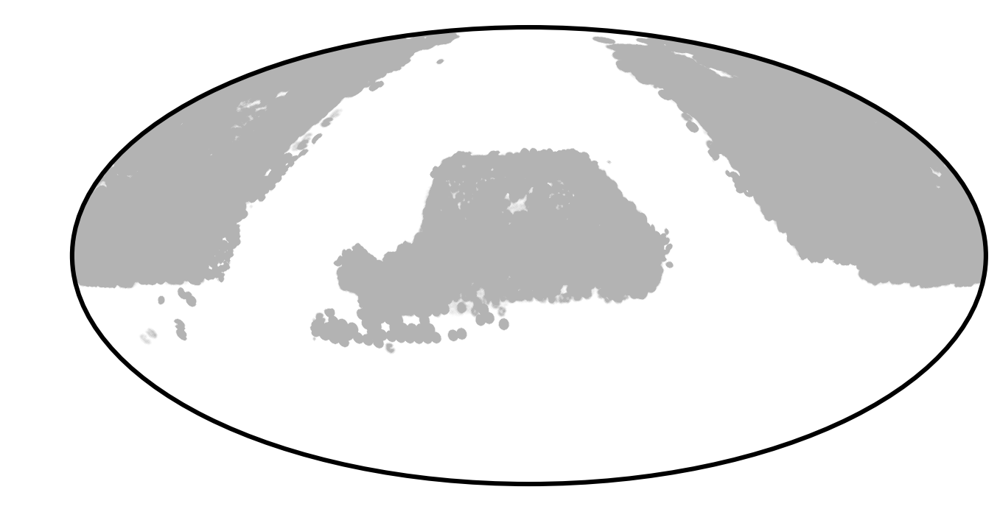

In [ ]:
# you currently have these:
# desi_ra_rad   = np.radians(desi_ra_deg_original)
# stream_ra_rad = np.radians(stream_ra_deg_original)

# convert back to degrees
desi_ra_deg   = np.degrees(desi_ra_rad)
stream_ra_deg = np.degrees(stream_ra_rad)

def ra_to_mollweide(ra_deg):
    """
    RA in degrees (0–360) → longitude in radians (-pi .. pi),
    with 0° RA centered and RA increasing to the left.
    """
    lon_deg = (-(ra_deg + 180.0)) % 360.0 - 180.0
    return np.radians(lon_deg)

desi_ra_rad_moll   = ra_to_mollweide(desi_ra_deg)
stream_ra_rad_moll = ra_to_mollweide(stream_ra_deg)

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection="mollweide")

ax.scatter(desi_ra_rad_moll, desi_dec_rad, s=0.1, c='0.7', alpha=0.01, zorder=0)
ax.scatter([], [], s=20, c='0.7', alpha=0.4, label='DESI MWS Footprint', zorder=0)
# ax.scatter(stream_ra_rad_moll, stream_dec_rad, s=10, c='white', zorder=1, label='C-19 (this work)')

# ax.set_xlabel(r"$\alpha$ (°)", fontsize=12)
# ax.set_ylabel(r"$\delta$ (°)", fontsize=12)

# Tick labels
tick_labels_deg = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])
tick_labels_rad = ra_to_mollweide(tick_labels_deg)
ax.set_xticks(tick_labels_rad)
ax.set_xticklabels([" " for l in tick_labels_deg])
# ax.set_xticklabels([f"{l}°" for l in tick_labels_deg])
# font colour for yaxis ticks white
ax.tick_params(axis='y', colors='white')

# ax.grid(True, zorder=0, alpha=0.5, ls='-.')
# # ax.legend(loc='upper right', fontsize=10)

# for ax_ in plt.gcf().get_axes():
#     for artist in ax_.get_children():
#         artist.set_rasterized(True)